In [1]:
import os
import shutil
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from tqdm import tqdm
from pathlib import Path
import concurrent.futures
import re
from collections import defaultdict
import random
from concurrent.futures import ThreadPoolExecutor
import math

from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split

from lifelines import KaplanMeierFitter
from lifelines.statistics import logrank_test

import json
import requests
import configparser
config = configparser.ConfigParser()
config.read("../config.ini")

import openslide
import cv2

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import DataLoader, Dataset, random_split
from torchvision import transforms
from torchvision.models import VGG19_Weights, ResNet18_Weights
from torchvision import models

with open(config["case_ids"]["case_ids"], "r") as file:
    case_ids = [line.strip() for line in file]

case_ids = list(pd.read_csv(config["labels"]["labels"])["submitter_id"].values)


# Code for process_wsi.py

In [27]:
with open(config["case_ids"]["full_case_ids"], "r") as file:
    full_case_ids = [line.strip() for line in file]

undone_case_ids = [c for c in full_case_ids if c not in case_ids]
len(undone_case_ids)

current = os.listdir(r"D:\data\wsi_slides")
undone_case_ids = [c for c in full_case_ids if c not in current]
len(current), len(undone_case_ids)

(539, 0)

In [28]:
np.random.seed(0)
torch.manual_seed(0)
random.seed(0)

num_patches = 1000  # arbitrary, #TODO
patch_size = 500   # patch size at 20X

# this loop iterates over the SVS files in the examples_2_patient folder
# and then extracts patches from the tissue mask of each slide

def extract_patches_from_tissue_mask(subject_svs_filepath, num_patches=num_patches, patch_size=patch_size):

    patches_folder = os.path.dirname(subject_svs_filepath) + f"/patches"
    Path(patches_folder).mkdir(parents=True, exist_ok=True)
    print(f"\textracting patches from {subject_svs_filepath}")

    if len(os.listdir(patches_folder)) == num_patches * (len(os.listdir(os.path.dirname(subject_svs_filepath)))-1): # -1 for the patches folder
        return

    svs_file_id = subject_svs_filepath.split('/')[-1][:-4]

    slide = openslide.OpenSlide(subject_svs_filepath)

    level = 2   #TODO be careful, one of the slides crashed at level 1

    thumbnail = slide.read_region((0, 0), level, slide.level_dimensions[level])
    thumbnail = thumbnail.convert("RGB") # convert from PIL format to RGB
    thumbnail_np = np.array(thumbnail) # convert to numpy array

    #### apply otus thresholding to extract tissue mask
    gray = cv2.cvtColor(thumbnail_np, cv2.COLOR_RGB2GRAY)
    _, tissue_mask = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # invert mask so tissue = white (255), background = black (0)
    tissue_mask = cv2.bitwise_not(tissue_mask)

    #############################################  
    #### zooming patches to the tissue mask #####
    #############################################

    # use scale factor instead of resizing (avoid mem error)
    scale_factor = slide.level_downsamples[level]  
    mask_coords = np.column_stack(np.where(tissue_mask > 0))  # (y, x) positions at level 2

    # map mask coordinates to level 0 size (20X magnification)
    scaled_coords = [(int(y * scale_factor), int(x * scale_factor)) for y, x in mask_coords]
    # print("\t-- scaled_coords, first 5 coords:", scaled_coords[:5])  

    # randomly sample coordinates for patches
    sampled_coords = random.sample(scaled_coords, min(num_patches, len(scaled_coords)))

    # collect/save patches
    for i, (y, x) in enumerate(sampled_coords): #, desc="extracting patches"):
        # read the patch from the slide
        patch = slide.read_region((x, y), 0, (patch_size, patch_size))  
        patch = patch.convert("RGB")   # convert from PIL format to RGB
        patch_filename = f"{patches_folder}/{svs_file_id}_{y}_{x}.png"
        patch.save(patch_filename, "PNG")

    slide.close()

    print(f"\tsaved {len(os.listdir(patches_folder))} patches in {patches_folder}")


In [29]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("device:", device)

#############################################
### data loader for the extracted patches ###
#############################################
class PatchDataset(Dataset):
    """
    Patches
    """
    def __init__(self, folder, transform=None):
        self.folder = folder
        self.files = [os.path.join(self.folder, f) for f in os.listdir(folder)
                      if os.path.isfile(os.path.join(self.folder, f))]
        self.transform = transform
    def __len__(self):
        return len(self.files)
    def __getitem__(self, idx):
        # convert from BGR to RGB
        image = cv2.imread(self.files[idx])
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        if self.transform:
            image = self.transform(image)
        # return image object and filename
        filename = self.files[idx].split("\\")[-1]
        return image, filename


#############################################
### define transforms for ResNet18 input #######
#############################################
# VGG19 expects 224x224 images and imagnet normalization
# and ResNet18 augmentations # NOTE
transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std =[0.229, 0.224, 0.225])
])


#############################################
####### load pre-trained ResNet18 model ########
#############################################
#############################################
### extract features for each patch ##########
#############################################
# want to extract a feature vector rather than classification scores.
# thus, build a new Sequential model that goes through
# 1. model.features (convolutional part)
# 2. model.avgpool (adaptive avg pooling)
# 3. flatten (convert a tensor to a vector)
# 4. model.classifier = False 
# result is a some-dimensional feature vector for each patch image

def extract_features_from_all_patches(dataloader, model_name="resnet18", device=device):
    """
    extracts features from patches of one SVS file
    """
    feature_extractor = None

    if model_name == "vgg19":
        # pretrained imagenet
        model = models.vgg19(weights=VGG19_Weights.IMAGENET1K_V1)
        model.to(device)
        model.eval()   # no need to train, use the current weights to extract features

        feature_extractor = torch.nn.Sequential(
            model.features,
            model.avgpool,
            torch.nn.Flatten(),
        *list(model.classifier.children())[:-1] # remove the last layer
    ).to(device)

    elif model_name == "resnet18":
        model = models.resnet18(weights=ResNet18_Weights.IMAGENET1K_V1)
        model.to(device)
        model.eval()   # no need to train, use the current weights to extract features

        feature_extractor = torch.nn.Sequential(
            *list(model.children())[:-1],  # all layers except the final fc layer
            torch.nn.Flatten()
        ).to(device)

    patches_features = {}

    with torch.no_grad():
        for image, file_name in tqdm(dataloader):
            image = image.to(device)
            features_model = feature_extractor(image)  
            # to numpy array
            patches_features[file_name[0]] = features_model.squeeze(0).cpu().numpy()  

    return patches_features

device: cuda


In [45]:
model = models.resnet18(weights=ResNet18_Weights.IMAGENET1K_V1)
model.to(device)
model.eval()   # no need to train, use the current weights to extract features

feature_extractor = torch.nn.Sequential(
*list(model.children())[:-1],  # all layers except the final fc layer
# torch.nn.Flatten()
).to(device)

# patches_features = {}

# with torch.no_grad():
#     for image, file_name in tqdm(dataloader):
#         image = image.to(device)
#         features_model = feature_extractor(image)  
#         # to numpy array
#         patches_features[file_name[0]] = features_model.squeeze(0).cpu().numpy()  

image = cv2.imread(r"D:\data\wsi_slides\TCGA-BP-5191\patches\TCGA-BP-5191-11A-01-TS1.3ca2cbc7-dd07-4563-90db-a3f3b0b5f4e5_8546_12707.png")
image = transform(cv2.cvtColor(image, cv2.COLOR_BGR2RGB)).unsqueeze(0).to(device)

feature_extractor(image).shape

torch.Size([1, 512, 1, 1])

In [46]:
model

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [ ]:
np.random.seed(0)
torch.manual_seed(0)
random.seed(0)

selected_cases_to_download = case_ids[0:15] # TODO: just run this immediately (feb 15)

cases_with_big_tumors = [] # visual later, need to find some # TODO to save the original svs files and patch pngs

cases_without_slides = []

num_slides = 5

for case in selected_cases_to_download:

    case_dir = config["wsi"]["wsi_slides"] + case
    os.makedirs(case_dir, exist_ok=True)

    if os.path.exists(f"{case_dir}/patches_features.npy"):
        continue

    # download the slides
    try:
        utils.download_slides(case, case_dir, num_slides=num_slides)
        if len(os.listdir(case_dir)) not in range(1, num_slides+1):
            cases_without_slides.append(case)
            continue
    except Exception as e:
        print(e)
        continue
    print(f"{case}'s {len(os.listdir(case_dir))} slides are downloaded")

    # extract patches from tissue mask from each svs slide
    svs_paths = [f"{case_dir}/{svs_file}" for svs_file in os.listdir(case_dir) if svs_file.endswith('.svs')]
    with concurrent.futures.ThreadPoolExecutor(max_workers=5) as executor:
        executor.map(extract_patches_from_tissue_mask, svs_paths)

    # after getting the patches, delete all the SVS files
    # to save space # NOTE: very important
    for svs_file in svs_paths:
        os.remove(svs_file)

    # extracting features from all patches (from all svs slides) of this case
    patches_folder = f"{case_dir}/patches"
    dataset = PatchDataset(patches_folder, transform=transform)
    dataloader = DataLoader(dataset, batch_size=1, shuffle=False)
    print(f"\textracting features from {len(dataset)} patches")
    patches_features = extract_features_from_all_patches(dataloader, model_name="resnet18", device=device)

    # save the features to a npy file
    np.save(f"{case_dir}/patches_features.npy", patches_features)

    # delete the patches folder to save space
    shutil.rmtree(patches_folder)

print("cases without slides:", cases_without_slides)

# # NOTE: to delete
# # visual purpose for this cohort
# # write the case ids to a file
# with open("case_ids_80_90_visual.txt", "w") as file:
#     for case in cases_with_big_tumors:
#         file.write(case + "\n")


TCGA-B8-4151's 3 slides are downloaded
	extracting patches from D:/data/wsi_slides/TCGA-B8-4151/TCGA-B8-4151-01A-01-BS1.0111d40b-954f-4743-8fea-8223d9f22fc9.svs
	extracting patches from D:/data/wsi_slides/TCGA-B8-4151/TCGA-B8-4151-01A-01-TS1.a22cbd79-ab39-4a16-8f0d-e6e1b98a613f.svs
	extracting patches from D:/data/wsi_slides/TCGA-B8-4151/TCGA-B8-4151-01Z-00-DX1.70d1897f-f121-4e02-a028-91fadeff2229.svs
	saved 2516 patches in D:/data/wsi_slides/TCGA-B8-4151/patches
	saved 2564 patches in D:/data/wsi_slides/TCGA-B8-4151/patches
	saved 3000 patches in D:/data/wsi_slides/TCGA-B8-4151/patches
	extracting features from 3000 patches


100%|██████████| 3000/3000 [02:34<00:00, 19.40it/s]


TCGA-CJ-6033's 4 slides are downloaded
	extracting patches from D:/data/wsi_slides/TCGA-CJ-6033/TCGA-CJ-6033-01A-01-BS1.d8c42f88-31b4-4e2e-b92e-186e3aceabf6.svs
	extracting patches from D:/data/wsi_slides/TCGA-CJ-6033/TCGA-CJ-6033-01A-01-TS1.f868f16b-56f5-4acb-a4ce-b64e78e1d5cb.svs
	extracting patches from D:/data/wsi_slides/TCGA-CJ-6033/TCGA-CJ-6033-01Z-00-DX1.5DD2C8F4-50E1-47C3-B5D4-058AE04095DD.svs
	extracting patches from D:/data/wsi_slides/TCGA-CJ-6033/TCGA-CJ-6033-11A-01-TS1.0f1f958a-fe54-4b10-aefa-5e49e61f7c5d.svs
	saved 3212 patches in D:/data/wsi_slides/TCGA-CJ-6033/patches
	saved 3266 patches in D:/data/wsi_slides/TCGA-CJ-6033/patches
	saved 3397 patches in D:/data/wsi_slides/TCGA-CJ-6033/patches
	saved 4000 patches in D:/data/wsi_slides/TCGA-CJ-6033/patches
	extracting features from 4000 patches


100%|██████████| 4000/4000 [05:25<00:00, 12.27it/s]


TCGA-B0-5081's 4 slides are downloaded
	extracting patches from D:/data/wsi_slides/TCGA-B0-5081/TCGA-B0-5081-01A-01-BS1.fbf07502-14bf-45dd-8834-b3ccf4282a52.svs
	extracting patches from D:/data/wsi_slides/TCGA-B0-5081/TCGA-B0-5081-01A-01-TS1.88d098af-6f5a-4bee-82d3-447708467d31.svs
	extracting patches from D:/data/wsi_slides/TCGA-B0-5081/TCGA-B0-5081-01Z-00-DX1.2fed8120-8e9c-4a23-bd1b-645f91450464.svs
	extracting patches from D:/data/wsi_slides/TCGA-B0-5081/TCGA-B0-5081-11A-01-TS1.51625bbe-cd09-4240-829c-e310152531e2.svs
	saved 3296 patches in D:/data/wsi_slides/TCGA-B0-5081/patches
	saved 3399 patches in D:/data/wsi_slides/TCGA-B0-5081/patches
	saved 3446 patches in D:/data/wsi_slides/TCGA-B0-5081/patches
	saved 4000 patches in D:/data/wsi_slides/TCGA-B0-5081/patches
	extracting features from 4000 patches


100%|██████████| 4000/4000 [05:09<00:00, 12.93it/s]


TCGA-B0-5085's 4 slides are downloaded
	extracting patches from D:/data/wsi_slides/TCGA-B0-5085/TCGA-B0-5085-01A-01-BS1.f9c25e3a-712c-47cd-8384-40f5c0e4ffc3.svs
	extracting patches from D:/data/wsi_slides/TCGA-B0-5085/TCGA-B0-5085-01A-01-TS1.a22e7529-2956-496d-ad90-d4b2b80b8934.svs
	extracting patches from D:/data/wsi_slides/TCGA-B0-5085/TCGA-B0-5085-01Z-00-DX1.29c82ff0-9e4d-477f-a8d9-8931c69e58f8.svs
	extracting patches from D:/data/wsi_slides/TCGA-B0-5085/TCGA-B0-5085-11A-01-TS1.5efb39fd-d6ff-4fae-8bce-35c3e842a7f7.svs
	saved 3473 patches in D:/data/wsi_slides/TCGA-B0-5085/patches
	saved 3492 patches in D:/data/wsi_slides/TCGA-B0-5085/patches
	saved 3653 patches in D:/data/wsi_slides/TCGA-B0-5085/patches
	saved 4000 patches in D:/data/wsi_slides/TCGA-B0-5085/patches
	extracting features from 4000 patches


100%|██████████| 4000/4000 [04:38<00:00, 14.37it/s]


TCGA-B8-A54F's 2 slides are downloaded
	extracting patches from D:/data/wsi_slides/TCGA-B8-A54F/TCGA-B8-A54F-01A-01-TS1.23F992B5-71EE-4DB1-B15C-6F07ACD4E8F5.svs
	extracting patches from D:/data/wsi_slides/TCGA-B8-A54F/TCGA-B8-A54F-01Z-00-DX1.7C46D299-64F5-42C0-8226-A1AB4FF5C879.svs
	saved 1657 patches in D:/data/wsi_slides/TCGA-B8-A54F/patches
	saved 2000 patches in D:/data/wsi_slides/TCGA-B8-A54F/patches
	extracting features from 2000 patches


100%|██████████| 2000/2000 [02:10<00:00, 15.30it/s]


TCGA-B8-5550's 3 slides are downloaded
	extracting patches from D:/data/wsi_slides/TCGA-B8-5550/TCGA-B8-5550-01A-01-BS1.62f9852e-2ec6-4913-8b87-f10e68917958.svs
	extracting patches from D:/data/wsi_slides/TCGA-B8-5550/TCGA-B8-5550-01A-01-TS1.cf0aacf8-98d8-4df6-bf86-9ba6e86ebb85.svs
	extracting patches from D:/data/wsi_slides/TCGA-B8-5550/TCGA-B8-5550-01Z-00-DX1.f9c84121-b555-486b-9049-9b87c7268e0a.svs
	saved 2532 patches in D:/data/wsi_slides/TCGA-B8-5550/patches
	saved 2541 patches in D:/data/wsi_slides/TCGA-B8-5550/patches
	saved 3000 patches in D:/data/wsi_slides/TCGA-B8-5550/patches
	extracting features from 3000 patches


100%|██████████| 3000/3000 [02:20<00:00, 21.40it/s]


TCGA-CJ-4923's 4 slides are downloaded
	extracting patches from D:/data/wsi_slides/TCGA-CJ-4923/TCGA-CJ-4923-01A-01-BS1.6c49528e-d5bf-46f7-8a48-a340d766bd8b.svs
	extracting patches from D:/data/wsi_slides/TCGA-CJ-4923/TCGA-CJ-4923-01A-01-TS1.a730db2c-a184-4581-8d3e-a71e091da0f7.svs
	extracting patches from D:/data/wsi_slides/TCGA-CJ-4923/TCGA-CJ-4923-01Z-00-DX1.ADD3D7FE-46D1-49AF-B6D4-1FD07B761EF1.svs
	extracting patches from D:/data/wsi_slides/TCGA-CJ-4923/TCGA-CJ-4923-11A-01-TS1.16f5c3b2-839c-4ba0-b450-9cf963c933aa.svs
	saved 3396 patches in D:/data/wsi_slides/TCGA-CJ-4923/patches
	saved 3431 patches in D:/data/wsi_slides/TCGA-CJ-4923/patches
	saved 3475 patches in D:/data/wsi_slides/TCGA-CJ-4923/patches
	saved 4000 patches in D:/data/wsi_slides/TCGA-CJ-4923/patches
	extracting features from 4000 patches


100%|██████████| 4000/4000 [04:33<00:00, 14.62it/s]


TCGA-CZ-5466's 4 slides are downloaded
	extracting patches from D:/data/wsi_slides/TCGA-CZ-5466/TCGA-CZ-5466-01A-01-BS1.bb340629-881e-4cca-b3a3-e15ce2e7ea10.svs
	extracting patches from D:/data/wsi_slides/TCGA-CZ-5466/TCGA-CZ-5466-01A-01-TS1.9326e64b-66f8-4fcb-af13-eb5994d2be37.svs
	extracting patches from D:/data/wsi_slides/TCGA-CZ-5466/TCGA-CZ-5466-01Z-00-DX1.f0fd74a8-2430-45dd-9c76-8794619ccf9d.svs
	extracting patches from D:/data/wsi_slides/TCGA-CZ-5466/TCGA-CZ-5466-11A-01-TS1.7dee9b4f-9f16-48c9-8a09-64647e72568d.svs
	saved 3506 patches in D:/data/wsi_slides/TCGA-CZ-5466/patches
	saved 3533 patches in D:/data/wsi_slides/TCGA-CZ-5466/patches
	saved 3570 patches in D:/data/wsi_slides/TCGA-CZ-5466/patches
	saved 4000 patches in D:/data/wsi_slides/TCGA-CZ-5466/patches
	extracting features from 4000 patches


100%|██████████| 4000/4000 [03:15<00:00, 20.43it/s]


TCGA-B0-5702's 4 slides are downloaded
	extracting patches from D:/data/wsi_slides/TCGA-B0-5702/TCGA-B0-5702-01A-01-BS1.bc648915-8f6e-440b-a4f6-212a7adbffed.svs
	extracting patches from D:/data/wsi_slides/TCGA-B0-5702/TCGA-B0-5702-01A-01-TS1.46f85a16-fa32-48c5-ad65-3aa0cc998fe0.svs
	extracting patches from D:/data/wsi_slides/TCGA-B0-5702/TCGA-B0-5702-01Z-00-DX1.a455181a-c4a5-40f5-b82e-be5bc6bb0a41.svs
	extracting patches from D:/data/wsi_slides/TCGA-B0-5702/TCGA-B0-5702-11A-01-TS1.64b1bfbc-fa53-4ec0-b756-d5fefc6ed1e3.svs
	saved 3440 patches in D:/data/wsi_slides/TCGA-B0-5702/patches
	saved 3532 patches in D:/data/wsi_slides/TCGA-B0-5702/patches
	saved 3651 patches in D:/data/wsi_slides/TCGA-B0-5702/patches
	saved 4000 patches in D:/data/wsi_slides/TCGA-B0-5702/patches
	extracting features from 4000 patches


100%|██████████| 4000/4000 [02:28<00:00, 26.96it/s]


TCGA-CZ-5464's 4 slides are downloaded
	extracting patches from D:/data/wsi_slides/TCGA-CZ-5464/TCGA-CZ-5464-01A-01-BS1.e8e2dc39-c0c9-4922-911b-0852cb0202cb.svs
	extracting patches from D:/data/wsi_slides/TCGA-CZ-5464/TCGA-CZ-5464-01A-01-TS1.ebeb25cc-4229-4160-8dc4-09269c5f1c23.svs
	extracting patches from D:/data/wsi_slides/TCGA-CZ-5464/TCGA-CZ-5464-01Z-00-DX1.093c64f0-b49e-48a8-a3af-ed0af4b6a548.svs
	extracting patches from D:/data/wsi_slides/TCGA-CZ-5464/TCGA-CZ-5464-11A-01-TS1.714c04c4-6c61-47da-b30a-68fe98a57834.svs
	saved 3512 patches in D:/data/wsi_slides/TCGA-CZ-5464/patches
	saved 3532 patches in D:/data/wsi_slides/TCGA-CZ-5464/patches
	saved 3664 patches in D:/data/wsi_slides/TCGA-CZ-5464/patches
	saved 4000 patches in D:/data/wsi_slides/TCGA-CZ-5464/patches
	extracting features from 4000 patches


100%|██████████| 4000/4000 [02:41<00:00, 24.83it/s]


TCGA-BP-4781's 4 slides are downloaded
	extracting patches from D:/data/wsi_slides/TCGA-BP-4781/TCGA-BP-4781-01A-01-BS1.e07e12b3-c573-4e3b-a6bb-9dcde522aa58.svs
	extracting patches from D:/data/wsi_slides/TCGA-BP-4781/TCGA-BP-4781-01A-01-TS1.ae5fee22-1188-48e9-8896-b49de7ae2de9.svs
	extracting patches from D:/data/wsi_slides/TCGA-BP-4781/TCGA-BP-4781-01Z-00-DX1.5bb96821-4711-4fb3-8fd6-5469240a050b.svs
	extracting patches from D:/data/wsi_slides/TCGA-BP-4781/TCGA-BP-4781-11A-01-TS1.f969311e-b889-483e-a67e-a5f213bf2a70.svs
	saved 3526 patches in D:/data/wsi_slides/TCGA-BP-4781/patches
	saved 3620 patches in D:/data/wsi_slides/TCGA-BP-4781/patches
	saved 3655 patches in D:/data/wsi_slides/TCGA-BP-4781/patches
	saved 4000 patches in D:/data/wsi_slides/TCGA-BP-4781/patches
	extracting features from 4000 patches


100%|██████████| 4000/4000 [02:41<00:00, 24.81it/s]


TCGA-B8-A54D's 2 slides are downloaded
	extracting patches from D:/data/wsi_slides/TCGA-B8-A54D/TCGA-B8-A54D-01A-02-TS2.C3F86ECE-94E1-4D0D-9AF8-E0021DA29A55.svs
	extracting patches from D:/data/wsi_slides/TCGA-B8-A54D/TCGA-B8-A54D-01Z-00-DX1.DCD17375-918C-4AEA-96F0-7FF8FCF4D00B.svs
	saved 1893 patches in D:/data/wsi_slides/TCGA-B8-A54D/patches
	saved 2000 patches in D:/data/wsi_slides/TCGA-B8-A54D/patches
	extracting features from 2000 patches


100%|██████████| 2000/2000 [01:17<00:00, 25.91it/s]


TCGA-BP-4170's 5 slides are downloaded
	extracting patches from D:/data/wsi_slides/TCGA-BP-4170/TCGA-BP-4170-01A-01-BS1.f4c74826-a5c2-4440-b7bb-c3506aae8b27.svs
	extracting patches from D:/data/wsi_slides/TCGA-BP-4170/TCGA-BP-4170-01A-02-BS2.17861965-01aa-4c60-96a2-2fcfa310e7db.svs
	extracting patches from D:/data/wsi_slides/TCGA-BP-4170/TCGA-BP-4170-01Z-00-DX1.6a40609b-239a-40e2-abd1-ccbf51b64b86.svs
	extracting patches from D:/data/wsi_slides/TCGA-BP-4170/TCGA-BP-4170-11A-01-BS1.ab694782-f59d-44d6-9644-ec887302bfdc.svs
	extracting patches from D:/data/wsi_slides/TCGA-BP-4170/TCGA-BP-4170-11A-01-TS1.fc067a2b-bdd1-482e-ab47-da4ea6945e9f.svs
	saved 4344 patches in D:/data/wsi_slides/TCGA-BP-4170/patches
	saved 4568 patches in D:/data/wsi_slides/TCGA-BP-4170/patches
	saved 4597 patches in D:/data/wsi_slides/TCGA-BP-4170/patches
	saved 4720 patches in D:/data/wsi_slides/TCGA-BP-4170/patches
	saved 5000 patches in D:/data/wsi_slides/TCGA-BP-4170/patches
	extracting features from 5000 patch

100%|██████████| 5000/5000 [03:24<00:00, 24.50it/s]


TCGA-B0-5707's 4 slides are downloaded
	extracting patches from D:/data/wsi_slides/TCGA-B0-5707/TCGA-B0-5707-01A-01-BS1.924b2080-b916-4a46-82f9-0d0ce1a70ded.svs
	extracting patches from D:/data/wsi_slides/TCGA-B0-5707/TCGA-B0-5707-01A-01-TS1.e244a2f4-98d1-4f6e-b92c-2faede75b0ec.svs
	extracting patches from D:/data/wsi_slides/TCGA-B0-5707/TCGA-B0-5707-01Z-00-DX1.a531abb4-5981-4fa2-a6e0-a2e3b64b0688.svs
	extracting patches from D:/data/wsi_slides/TCGA-B0-5707/TCGA-B0-5707-11A-01-TS1.c8d977cf-cdff-4ac2-af87-a9f2bad7d61c.svs
	saved 3457 patches in D:/data/wsi_slides/TCGA-B0-5707/patches
	saved 3537 patches in D:/data/wsi_slides/TCGA-B0-5707/patches
	saved 3588 patches in D:/data/wsi_slides/TCGA-B0-5707/patches
	saved 4000 patches in D:/data/wsi_slides/TCGA-B0-5707/patches
	extracting features from 4000 patches


100%|██████████| 4000/4000 [02:32<00:00, 26.26it/s]


TCGA-BP-4761's 4 slides are downloaded
	extracting patches from D:/data/wsi_slides/TCGA-BP-4761/TCGA-BP-4761-01A-01-BS1.c6226c7d-8265-4293-9743-adee4ba03b5c.svs
	extracting patches from D:/data/wsi_slides/TCGA-BP-4761/TCGA-BP-4761-01A-01-TS1.f206972f-821b-4654-96c6-95a21f78c055.svs
	extracting patches from D:/data/wsi_slides/TCGA-BP-4761/TCGA-BP-4761-01Z-00-DX1.a53a55ed-a49f-4b4e-ba94-f64da0eedc4f.svs
	extracting patches from D:/data/wsi_slides/TCGA-BP-4761/TCGA-BP-4761-11A-01-TS1.1473471a-bc39-496b-9fca-bdd3fa6d47e4.svs
	saved 3502 patches in D:/data/wsi_slides/TCGA-BP-4761/patches
	saved 3652 patches in D:/data/wsi_slides/TCGA-BP-4761/patches
	saved 3656 patches in D:/data/wsi_slides/TCGA-BP-4761/patches
	saved 4000 patches in D:/data/wsi_slides/TCGA-BP-4761/patches
	extracting features from 4000 patches


100%|██████████| 4000/4000 [02:49<00:00, 23.64it/s]


TCGA-CW-5581's 2 slides are downloaded
	extracting patches from D:/data/wsi_slides/TCGA-CW-5581/TCGA-CW-5581-01A-01-BS1.9b5821de-2c19-4895-b2ab-d907296cabf2.svs
	extracting patches from D:/data/wsi_slides/TCGA-CW-5581/TCGA-CW-5581-11A-01-TS1.3ec50e75-b9af-4a2b-9dfa-1ee1cac6d14b.svs
	saved 1972 patches in D:/data/wsi_slides/TCGA-CW-5581/patches
	saved 2000 patches in D:/data/wsi_slides/TCGA-CW-5581/patches
	extracting features from 2000 patches


100%|██████████| 2000/2000 [01:47<00:00, 18.63it/s]


TCGA-CJ-5681's 4 slides are downloaded
	extracting patches from D:/data/wsi_slides/TCGA-CJ-5681/TCGA-CJ-5681-01A-01-BS1.405a4fec-381d-4660-bff0-ea3a0eb1b782.svs
	extracting patches from D:/data/wsi_slides/TCGA-CJ-5681/TCGA-CJ-5681-01A-01-TS1.c05ad447-c6ef-44c5-b7a2-42d438d7e9f4.svs
	extracting patches from D:/data/wsi_slides/TCGA-CJ-5681/TCGA-CJ-5681-01Z-00-DX1.103D5A1F-B07C-4090-8E3A-770514D2BBC4.svs
	extracting patches from D:/data/wsi_slides/TCGA-CJ-5681/TCGA-CJ-5681-11A-01-TS1.24256c0e-3068-4924-9b10-6e8b358666ac.svs
	saved 3746 patches in D:/data/wsi_slides/TCGA-CJ-5681/patches
	saved 3955 patches in D:/data/wsi_slides/TCGA-CJ-5681/patches
	saved 3983 patches in D:/data/wsi_slides/TCGA-CJ-5681/patches
	saved 4000 patches in D:/data/wsi_slides/TCGA-CJ-5681/patches
	extracting features from 4000 patches


100%|██████████| 4000/4000 [03:45<00:00, 17.76it/s]


TCGA-BP-4166's 5 slides are downloaded
	extracting patches from D:/data/wsi_slides/TCGA-BP-4166/TCGA-BP-4166-01A-01-BS1.02522974-12da-42fc-849a-f57b8406c9ba.svs
	extracting patches from D:/data/wsi_slides/TCGA-BP-4166/TCGA-BP-4166-01A-02-BS2.129550c4-f1a5-4d31-bc9b-7ef2d8c3d6a1.svs
	extracting patches from D:/data/wsi_slides/TCGA-BP-4166/TCGA-BP-4166-01Z-00-DX1.e27fcaa7-7d9a-48db-8bae-518a10bde786.svs
	extracting patches from D:/data/wsi_slides/TCGA-BP-4166/TCGA-BP-4166-11A-01-BS1.bf7d59c5-cd03-438b-bed7-476237773ed8.svs
	extracting patches from D:/data/wsi_slides/TCGA-BP-4166/TCGA-BP-4166-11A-01-TS1.46016603-c6fd-48be-bfbb-ad79359f7572.svs
	saved 4574 patches in D:/data/wsi_slides/TCGA-BP-4166/patches
	saved 4631 patches in D:/data/wsi_slides/TCGA-BP-4166/patches
	saved 4644 patches in D:/data/wsi_slides/TCGA-BP-4166/patches
	saved 4698 patches in D:/data/wsi_slides/TCGA-BP-4166/patches
	saved 5000 patches in D:/data/wsi_slides/TCGA-BP-4166/patches
	extracting features from 5000 patch

100%|██████████| 5000/5000 [03:48<00:00, 21.89it/s]


TCGA-CW-6090's 3 slides are downloaded
	extracting patches from D:/data/wsi_slides/TCGA-CW-6090/TCGA-CW-6090-01A-01-BS1.83d41b27-0061-480d-ab88-6eb5ee1332a3.svs
	extracting patches from D:/data/wsi_slides/TCGA-CW-6090/TCGA-CW-6090-01A-01-TS1.b660b792-f60f-4261-8ee5-f91db8616536.svs
	extracting patches from D:/data/wsi_slides/TCGA-CW-6090/TCGA-CW-6090-11A-01-TS1.1e28e525-404b-4b18-9224-69303f9eb006.svs
	saved 2945 patches in D:/data/wsi_slides/TCGA-CW-6090/patches
	saved 2990 patches in D:/data/wsi_slides/TCGA-CW-6090/patches
	saved 3000 patches in D:/data/wsi_slides/TCGA-CW-6090/patches
	extracting features from 3000 patches


100%|██████████| 3000/3000 [02:22<00:00, 20.99it/s]


TCGA-CJ-4884's 4 slides are downloaded
	extracting patches from D:/data/wsi_slides/TCGA-CJ-4884/TCGA-CJ-4884-01A-01-BS1.751816bb-894a-4bb2-af11-4d6be8e92db5.svs
	extracting patches from D:/data/wsi_slides/TCGA-CJ-4884/TCGA-CJ-4884-01A-01-TS1.c1c3e25d-ed6a-4373-a131-0456c54bd65a.svs
	extracting patches from D:/data/wsi_slides/TCGA-CJ-4884/TCGA-CJ-4884-01Z-00-DX1.E7A9735A-4ADB-4312-B205-781829DE4C5D.svs
	extracting patches from D:/data/wsi_slides/TCGA-CJ-4884/TCGA-CJ-4884-11A-01-TS1.7a05287c-7515-41a0-ab8b-430fb36948dd.svs
	saved 3347 patches in D:/data/wsi_slides/TCGA-CJ-4884/patches
	saved 3420 patches in D:/data/wsi_slides/TCGA-CJ-4884/patches
	saved 3446 patches in D:/data/wsi_slides/TCGA-CJ-4884/patches
	saved 4000 patches in D:/data/wsi_slides/TCGA-CJ-4884/patches
	extracting features from 4000 patches


100%|██████████| 4000/4000 [03:23<00:00, 19.61it/s]


TCGA-CJ-4916's 4 slides are downloaded
	extracting patches from D:/data/wsi_slides/TCGA-CJ-4916/TCGA-CJ-4916-01A-01-BS1.cb1e65d5-f7b7-4410-a400-38936c729dd7.svs
	extracting patches from D:/data/wsi_slides/TCGA-CJ-4916/TCGA-CJ-4916-01A-01-TS1.4b34ddbd-57ce-4c8c-988b-6eb1f2969908.svs
	extracting patches from D:/data/wsi_slides/TCGA-CJ-4916/TCGA-CJ-4916-01Z-00-DX1.9C306902-51B1-4968-BB06-DE21606DD963.svs
	extracting patches from D:/data/wsi_slides/TCGA-CJ-4916/TCGA-CJ-4916-11A-01-TS1.18a0da5d-c103-44d9-bc29-f58f99710423.svs
	saved 3346 patches in D:/data/wsi_slides/TCGA-CJ-4916/patches
	saved 3390 patches in D:/data/wsi_slides/TCGA-CJ-4916/patches
	saved 3455 patches in D:/data/wsi_slides/TCGA-CJ-4916/patches
	saved 4000 patches in D:/data/wsi_slides/TCGA-CJ-4916/patches
	extracting features from 4000 patches


100%|██████████| 4000/4000 [03:30<00:00, 18.96it/s]


('Connection broken: IncompleteRead(467664896 bytes read, 460012636 more expected)', IncompleteRead(467664896 bytes read, 460012636 more expected))
TCGA-CW-5583's 2 slides are downloaded
	extracting patches from D:/data/wsi_slides/TCGA-CW-5583/TCGA-CW-5583-01A-01-BS1.54c90e72-1570-488e-8219-a0ca5c58407b.svs
	extracting patches from D:/data/wsi_slides/TCGA-CW-5583/TCGA-CW-5583-11A-01-TS1.6094920a-3bb4-43f3-a5b4-137e7996fb54.svs
	saved 1978 patches in D:/data/wsi_slides/TCGA-CW-5583/patches
	saved 2000 patches in D:/data/wsi_slides/TCGA-CW-5583/patches
	extracting features from 2000 patches


100%|██████████| 2000/2000 [01:23<00:00, 23.93it/s]


TCGA-CZ-5455's 4 slides are downloaded
	extracting patches from D:/data/wsi_slides/TCGA-CZ-5455/TCGA-CZ-5455-01A-01-BS1.9be3cbd3-ca97-4933-a231-e118116f0287.svs
	extracting patches from D:/data/wsi_slides/TCGA-CZ-5455/TCGA-CZ-5455-01A-01-TS1.75006f52-a7b3-4742-b6f9-571d5f924c2d.svs
	extracting patches from D:/data/wsi_slides/TCGA-CZ-5455/TCGA-CZ-5455-01Z-00-DX1.f62e1d32-8a1e-4708-a0ba-93516a0b3dab.svs
	extracting patches from D:/data/wsi_slides/TCGA-CZ-5455/TCGA-CZ-5455-11A-01-TS1.11602ef1-42af-4134-9035-e5cc78ff3839.svs
	saved 3511 patches in D:/data/wsi_slides/TCGA-CZ-5455/patches
	saved 3532 patches in D:/data/wsi_slides/TCGA-CZ-5455/patches
	saved 3554 patches in D:/data/wsi_slides/TCGA-CZ-5455/patches
	saved 4000 patches in D:/data/wsi_slides/TCGA-CZ-5455/patches
	extracting features from 4000 patches


100%|██████████| 4000/4000 [03:02<00:00, 21.91it/s]


TCGA-CW-5580's 3 slides are downloaded
	extracting patches from D:/data/wsi_slides/TCGA-CW-5580/TCGA-CW-5580-01A-01-BS1.40b08696-d725-486e-bc88-2b7f882cc290.svs
	extracting patches from D:/data/wsi_slides/TCGA-CW-5580/TCGA-CW-5580-01A-01-TS1.284960c6-7f58-4e9f-bf21-8d3878c8cfbd.svs
	extracting patches from D:/data/wsi_slides/TCGA-CW-5580/TCGA-CW-5580-11A-01-TS1.2568bab3-cf3b-401f-8f19-b48dfd2d9671.svs
	saved 2975 patches in D:/data/wsi_slides/TCGA-CW-5580/patches
	saved 2982 patches in D:/data/wsi_slides/TCGA-CW-5580/patches
	saved 3000 patches in D:/data/wsi_slides/TCGA-CW-5580/patches
	extracting features from 3000 patches


100%|██████████| 3000/3000 [02:19<00:00, 21.57it/s]


TCGA-CJ-5678's 4 slides are downloaded
	extracting patches from D:/data/wsi_slides/TCGA-CJ-5678/TCGA-CJ-5678-01A-01-BS1.f4d46d7a-7646-4334-b919-eb3272cc7340.svs
	extracting patches from D:/data/wsi_slides/TCGA-CJ-5678/TCGA-CJ-5678-01A-01-TS1.b2e4ad03-2c11-4973-b9d9-30f8ffbbf0b1.svs
	extracting patches from D:/data/wsi_slides/TCGA-CJ-5678/TCGA-CJ-5678-01Z-00-DX1.E71A7F98-7D7F-4DFC-920F-27000010217F.svs
	extracting patches from D:/data/wsi_slides/TCGA-CJ-5678/TCGA-CJ-5678-11A-01-TS1.2b027ad4-be29-4e57-a554-ac7c26547e3c.svs
	saved 3795 patches in D:/data/wsi_slides/TCGA-CJ-5678/patches
	saved 3904 patches in D:/data/wsi_slides/TCGA-CJ-5678/patches
	saved 3997 patches in D:/data/wsi_slides/TCGA-CJ-5678/patches
	saved 4000 patches in D:/data/wsi_slides/TCGA-CJ-5678/patches
	extracting features from 4000 patches


100%|██████████| 4000/4000 [03:21<00:00, 19.85it/s]


TCGA-BP-4768's 4 slides are downloaded
	extracting patches from D:/data/wsi_slides/TCGA-BP-4768/TCGA-BP-4768-01A-01-BS1.d9eabc97-4649-4835-9027-940271bf7f68.svs
	extracting patches from D:/data/wsi_slides/TCGA-BP-4768/TCGA-BP-4768-01A-01-TS1.066043b7-9d92-46c7-a412-c276972dc50b.svs
	extracting patches from D:/data/wsi_slides/TCGA-BP-4768/TCGA-BP-4768-01Z-00-DX1.f56632b8-79d2-440d-a137-b9f667e4ef54.svs
	extracting patches from D:/data/wsi_slides/TCGA-BP-4768/TCGA-BP-4768-11A-01-TS1.97fa82ee-ebe0-47c3-8fa8-bc2b0462e2fd.svs
	saved 3401 patches in D:/data/wsi_slides/TCGA-BP-4768/patches
	saved 3491 patches in D:/data/wsi_slides/TCGA-BP-4768/patches
	saved 3567 patches in D:/data/wsi_slides/TCGA-BP-4768/patches
	saved 4000 patches in D:/data/wsi_slides/TCGA-BP-4768/patches
	extracting features from 4000 patches


100%|██████████| 4000/4000 [03:44<00:00, 17.85it/s]


TCGA-B8-5549's 4 slides are downloaded
	extracting patches from D:/data/wsi_slides/TCGA-B8-5549/TCGA-B8-5549-01A-01-BS1.5ab335f4-b1db-494b-9732-75e0fbf2ab67.svs
	extracting patches from D:/data/wsi_slides/TCGA-B8-5549/TCGA-B8-5549-01A-01-TS1.0b16dc85-c95b-4624-88c5-d6a58fe8766f.svs
	extracting patches from D:/data/wsi_slides/TCGA-B8-5549/TCGA-B8-5549-01Z-00-DX1.96d1ead6-37ad-4e5d-bc95-2ef4fd1a940d.svs
	extracting patches from D:/data/wsi_slides/TCGA-B8-5549/TCGA-B8-5549-11A-01-TS1.c5574643-1e62-4d6e-ade2-09cbca47c073.svs
	saved 3392 patches in D:/data/wsi_slides/TCGA-B8-5549/patches
	saved 3400 patches in D:/data/wsi_slides/TCGA-B8-5549/patches
	saved 3845 patches in D:/data/wsi_slides/TCGA-B8-5549/patches
	saved 4000 patches in D:/data/wsi_slides/TCGA-B8-5549/patches
	extracting features from 4000 patches


100%|██████████| 4000/4000 [03:45<00:00, 17.73it/s]


TCGA-CZ-5451's 4 slides are downloaded
	extracting patches from D:/data/wsi_slides/TCGA-CZ-5451/TCGA-CZ-5451-01A-01-BS1.88353366-8962-47fd-afcf-624deafd8fcb.svs
	extracting patches from D:/data/wsi_slides/TCGA-CZ-5451/TCGA-CZ-5451-01A-01-TS1.baba0b14-59a0-4d89-8bfb-a427a5906643.svs
	extracting patches from D:/data/wsi_slides/TCGA-CZ-5451/TCGA-CZ-5451-01Z-00-DX1.52404227-5c75-4cee-9da9-9176f3f3f89c.svs
	extracting patches from D:/data/wsi_slides/TCGA-CZ-5451/TCGA-CZ-5451-11A-01-TS1.4a9c3cb0-5145-4f15-9983-e3f1fc3b2ee4.svs
	saved 3471 patches in D:/data/wsi_slides/TCGA-CZ-5451/patches
	saved 3534 patches in D:/data/wsi_slides/TCGA-CZ-5451/patches
	saved 3543 patches in D:/data/wsi_slides/TCGA-CZ-5451/patches
	saved 4000 patches in D:/data/wsi_slides/TCGA-CZ-5451/patches
	extracting features from 4000 patches


100%|██████████| 4000/4000 [03:50<00:00, 17.34it/s]


TCGA-CJ-4912's 4 slides are downloaded
	extracting patches from D:/data/wsi_slides/TCGA-CJ-4912/TCGA-CJ-4912-01A-01-BS1.d72654a8-2783-469f-a58e-36b23167cd23.svs
	extracting patches from D:/data/wsi_slides/TCGA-CJ-4912/TCGA-CJ-4912-01A-01-TS1.f03de20e-2d81-4b6a-904e-0fb82c17e256.svs
	extracting patches from D:/data/wsi_slides/TCGA-CJ-4912/TCGA-CJ-4912-01Z-00-DX1.28805E39-F07A-40FF-8810-162BED671E17.svs
	extracting patches from D:/data/wsi_slides/TCGA-CJ-4912/TCGA-CJ-4912-11A-01-TS1.ef96b062-df9a-43c0-8c9e-63efacb28c62.svs
	saved 3350 patches in D:/data/wsi_slides/TCGA-CJ-4912/patches
	saved 3402 patches in D:/data/wsi_slides/TCGA-CJ-4912/patches
	saved 3426 patches in D:/data/wsi_slides/TCGA-CJ-4912/patches
	saved 4000 patches in D:/data/wsi_slides/TCGA-CJ-4912/patches
	extracting features from 4000 patches


100%|██████████| 4000/4000 [04:25<00:00, 15.08it/s]


TCGA-B8-4622's 5 slides are downloaded
	extracting patches from D:/data/wsi_slides/TCGA-B8-4622/TCGA-B8-4622-01A-01-BS1.d2f63f4d-0d21-485f-bde4-cb81cdf57fd9.svs
	extracting patches from D:/data/wsi_slides/TCGA-B8-4622/TCGA-B8-4622-01A-02-BS2.1c03c0cf-a853-4dd1-9ce7-fe4a621d6d31.svs
	extracting patches from D:/data/wsi_slides/TCGA-B8-4622/TCGA-B8-4622-01Z-00-DX1.4b46b786-3c2d-4520-a405-5ea10d346b74.svs
	extracting patches from D:/data/wsi_slides/TCGA-B8-4622/TCGA-B8-4622-11A-01-BS1.c7e2baa0-d84b-4420-b6cd-795f0ac69669.svs
	extracting patches from D:/data/wsi_slides/TCGA-B8-4622/TCGA-B8-4622-11A-01-TS1.d4840c85-d2e9-4494-940d-22f26dcff2a7.svs
	saved 4394 patches in D:/data/wsi_slides/TCGA-B8-4622/patches
	saved 4401 patches in D:/data/wsi_slides/TCGA-B8-4622/patches
	saved 4474 patches in D:/data/wsi_slides/TCGA-B8-4622/patches
	saved 4536 patches in D:/data/wsi_slides/TCGA-B8-4622/patches
	saved 5000 patches in D:/data/wsi_slides/TCGA-B8-4622/patches
	extracting features from 5000 patch

100%|██████████| 5000/5000 [04:53<00:00, 17.04it/s]


TCGA-B0-5709's 4 slides are downloaded
	extracting patches from D:/data/wsi_slides/TCGA-B0-5709/TCGA-B0-5709-01A-01-BS1.e85e5439-a03a-4f48-8434-221f6dbe9b23.svs
	extracting patches from D:/data/wsi_slides/TCGA-B0-5709/TCGA-B0-5709-01A-01-TS1.402dc0ee-dab0-498f-9c67-143d8d951123.svs
	extracting patches from D:/data/wsi_slides/TCGA-B0-5709/TCGA-B0-5709-01Z-00-DX1.8e4b701a-1ef7-4d79-a562-0f316c696984.svs
	extracting patches from D:/data/wsi_slides/TCGA-B0-5709/TCGA-B0-5709-11A-01-TS1.aff85b06-0b91-4463-88e6-2a5b3747761d.svs
	saved 3479 patches in D:/data/wsi_slides/TCGA-B0-5709/patches
	saved 3522 patches in D:/data/wsi_slides/TCGA-B0-5709/patches
	saved 3522 patches in D:/data/wsi_slides/TCGA-B0-5709/patches
	saved 4000 patches in D:/data/wsi_slides/TCGA-B0-5709/patches
	extracting features from 4000 patches


100%|██████████| 4000/4000 [03:51<00:00, 17.31it/s]


TCGA-B0-5115's 4 slides are downloaded
	extracting patches from D:/data/wsi_slides/TCGA-B0-5115/TCGA-B0-5115-01A-01-BS1.9265ef7a-7319-4433-aa26-6bb0169d2f5e.svs
	extracting patches from D:/data/wsi_slides/TCGA-B0-5115/TCGA-B0-5115-01A-01-TS1.12dc214e-bdf5-48cd-9a73-9880614dd217.svs
	extracting patches from D:/data/wsi_slides/TCGA-B0-5115/TCGA-B0-5115-01Z-00-DX1.f07e128b-5a67-409a-a420-ce953f291364.svs
	extracting patches from D:/data/wsi_slides/TCGA-B0-5115/TCGA-B0-5115-11A-01-TS1.068aa3ba-2f8e-48d8-a755-a488ff1a0335.svs
	saved 3506 patches in D:/data/wsi_slides/TCGA-B0-5115/patches
	saved 3574 patches in D:/data/wsi_slides/TCGA-B0-5115/patches
	saved 3589 patches in D:/data/wsi_slides/TCGA-B0-5115/patches
	saved 4000 patches in D:/data/wsi_slides/TCGA-B0-5115/patches
	extracting features from 4000 patches


100%|██████████| 4000/4000 [04:02<00:00, 16.53it/s]


TCGA-BP-4169's 5 slides are downloaded
	extracting patches from D:/data/wsi_slides/TCGA-BP-4169/TCGA-BP-4169-01A-01-BS1.05f07e7a-30ba-4b04-8eda-73cd75f8ef35.svs
	extracting patches from D:/data/wsi_slides/TCGA-BP-4169/TCGA-BP-4169-01A-02-BS2.098ba63d-b5ef-4c3f-ae4b-0c8f8b5f5006.svs
	extracting patches from D:/data/wsi_slides/TCGA-BP-4169/TCGA-BP-4169-01Z-00-DX1.f33af846-580f-4a85-9496-237edb239de1.svs
	extracting patches from D:/data/wsi_slides/TCGA-BP-4169/TCGA-BP-4169-11A-01-BS1.cd3051dd-8676-4e96-a761-de1792cc6ddc.svs
	extracting patches from D:/data/wsi_slides/TCGA-BP-4169/TCGA-BP-4169-11A-01-TS1.5c5e4f99-baa8-4524-adb7-262417b567f4.svs
	saved 4001 patches in D:/data/wsi_slides/TCGA-BP-4169/patches
	saved 4223 patches in D:/data/wsi_slides/TCGA-BP-4169/patches
	saved 4512 patches in D:/data/wsi_slides/TCGA-BP-4169/patches
	saved 4552 patches in D:/data/wsi_slides/TCGA-BP-4169/patches
	saved 5000 patches in D:/data/wsi_slides/TCGA-BP-4169/patches
	extracting features from 5000 patch

100%|██████████| 5000/5000 [03:54<00:00, 21.32it/s]


TCGA-BP-4173's 5 slides are downloaded
	extracting patches from D:/data/wsi_slides/TCGA-BP-4173/TCGA-BP-4173-01A-01-BS1.9ec0357d-3143-477e-beb4-6da463df68b4.svs
	extracting patches from D:/data/wsi_slides/TCGA-BP-4173/TCGA-BP-4173-01A-02-BS2.7d57e1d5-5076-408f-9d95-e1e8696e08fe.svs
	extracting patches from D:/data/wsi_slides/TCGA-BP-4173/TCGA-BP-4173-01Z-00-DX1.caac2fb6-767e-4e13-87d4-1a8b9558120b.svs
	extracting patches from D:/data/wsi_slides/TCGA-BP-4173/TCGA-BP-4173-11A-01-BS1.3ab32e5e-6f78-4c1a-8872-a61919334618.svs
	extracting patches from D:/data/wsi_slides/TCGA-BP-4173/TCGA-BP-4173-11A-01-TS1.aeac635c-58df-4094-9d09-88da9a6080a5.svs
	saved 4513 patches in D:/data/wsi_slides/TCGA-BP-4173/patches
	saved 4598 patches in D:/data/wsi_slides/TCGA-BP-4173/patches
	saved 4601 patches in D:/data/wsi_slides/TCGA-BP-4173/patches
	saved 4627 patches in D:/data/wsi_slides/TCGA-BP-4173/patches
	saved 5000 patches in D:/data/wsi_slides/TCGA-BP-4173/patches
	extracting features from 5000 patch

100%|██████████| 5000/5000 [03:32<00:00, 23.55it/s]


TCGA-CW-5589's 3 slides are downloaded
	extracting patches from D:/data/wsi_slides/TCGA-CW-5589/TCGA-CW-5589-01A-01-BS1.de327198-4658-433e-925e-088164bcc490.svs
	extracting patches from D:/data/wsi_slides/TCGA-CW-5589/TCGA-CW-5589-01A-01-TS1.d704b905-075c-4149-b882-0ea19a3b069f.svs
	extracting patches from D:/data/wsi_slides/TCGA-CW-5589/TCGA-CW-5589-11A-01-TS1.99947b7b-72c2-4bb0-ab72-b1e3de613bf3.svs
	saved 2970 patches in D:/data/wsi_slides/TCGA-CW-5589/patches
	saved 2995 patches in D:/data/wsi_slides/TCGA-CW-5589/patches
	saved 3000 patches in D:/data/wsi_slides/TCGA-CW-5589/patches
	extracting features from 3000 patches


100%|██████████| 3000/3000 [02:01<00:00, 24.69it/s]


TCGA-BP-4346's 5 slides are downloaded
	extracting patches from D:/data/wsi_slides/TCGA-BP-4346/TCGA-BP-4346-01A-01-BS1.f7e2faec-0fd2-41f2-82dc-8a888a1c01a5.svs
	extracting patches from D:/data/wsi_slides/TCGA-BP-4346/TCGA-BP-4346-01A-01-TS1.09b3f4a8-1366-41a0-b2ea-2dc010f431f8.svs
	extracting patches from D:/data/wsi_slides/TCGA-BP-4346/TCGA-BP-4346-01Z-00-DX1.e2f7b4ce-fbe8-482e-822e-ef428731f68b.svs	extracting patches from D:/data/wsi_slides/TCGA-BP-4346/TCGA-BP-4346-11A-01-BS1.bb49cb73-66de-4c20-a6ef-8483da3fc0e2.svs

	extracting patches from D:/data/wsi_slides/TCGA-BP-4346/TCGA-BP-4346-11A-01-TS1.f09ecda2-cab1-4f2b-a616-26f9ce4fd479.svs
	saved 4681 patches in D:/data/wsi_slides/TCGA-BP-4346/patches
	saved 4699 patches in D:/data/wsi_slides/TCGA-BP-4346/patches
	saved 4706 patches in D:/data/wsi_slides/TCGA-BP-4346/patches
	saved 4719 patches in D:/data/wsi_slides/TCGA-BP-4346/patches
	saved 5000 patches in D:/data/wsi_slides/TCGA-BP-4346/patches
	extracting features from 5000 patch

100%|██████████| 5000/5000 [03:35<00:00, 23.16it/s]


TCGA-CW-5587's 3 slides are downloaded
	extracting patches from D:/data/wsi_slides/TCGA-CW-5587/TCGA-CW-5587-01A-01-BS1.c7ac5085-943c-4c99-a1f0-b052d0185de0.svs
	extracting patches from D:/data/wsi_slides/TCGA-CW-5587/TCGA-CW-5587-01A-01-TS1.74e9edf5-d055-43b8-a219-a4afd3d1e917.svs
	extracting patches from D:/data/wsi_slides/TCGA-CW-5587/TCGA-CW-5587-11A-01-TS1.23a6ab87-748c-4883-9317-53e375ef0103.svs
	saved 2953 patches in D:/data/wsi_slides/TCGA-CW-5587/patches
	saved 2991 patches in D:/data/wsi_slides/TCGA-CW-5587/patches
	saved 3000 patches in D:/data/wsi_slides/TCGA-CW-5587/patches
	extracting features from 3000 patches


100%|██████████| 3000/3000 [02:04<00:00, 24.04it/s]


TCGA-BP-4345's 5 slides are downloaded
	extracting patches from D:/data/wsi_slides/TCGA-BP-4345/TCGA-BP-4345-01A-01-BS1.443e9ede-3536-431c-88c3-f111d0843be6.svs
	extracting patches from D:/data/wsi_slides/TCGA-BP-4345/TCGA-BP-4345-01A-01-TS1.33c3026b-d2a4-4ab8-9108-a706844afba0.svs
	extracting patches from D:/data/wsi_slides/TCGA-BP-4345/TCGA-BP-4345-01Z-00-DX1.5ada8b8e-40c4-4035-b34a-7bb0a0bb0005.svs
	extracting patches from D:/data/wsi_slides/TCGA-BP-4345/TCGA-BP-4345-11A-01-BS1.ebed6c30-1591-4187-ae5b-8e781de0ac08.svs
	extracting patches from D:/data/wsi_slides/TCGA-BP-4345/TCGA-BP-4345-11A-01-TS1.7bbfaafe-de5e-41ff-a46a-327247fb4d43.svs
	saved 4243 patches in D:/data/wsi_slides/TCGA-BP-4345/patches
	saved 4488 patches in D:/data/wsi_slides/TCGA-BP-4345/patches
	saved 4701 patches in D:/data/wsi_slides/TCGA-BP-4345/patches
	saved 4714 patches in D:/data/wsi_slides/TCGA-BP-4345/patches
	saved 5000 patches in D:/data/wsi_slides/TCGA-BP-4345/patches
	extracting features from 5000 patch

100%|██████████| 5000/5000 [03:29<00:00, 23.92it/s]


TCGA-CJ-4892's 4 slides are downloaded
	extracting patches from D:/data/wsi_slides/TCGA-CJ-4892/TCGA-CJ-4892-01A-01-BS1.ac7cae52-637b-4661-a4ab-9ce305374307.svs
	extracting patches from D:/data/wsi_slides/TCGA-CJ-4892/TCGA-CJ-4892-01A-01-TS1.0d2e687d-a701-45f4-bcc8-78b018850068.svs
	extracting patches from D:/data/wsi_slides/TCGA-CJ-4892/TCGA-CJ-4892-01Z-00-DX1.7732DE46-3F0B-4B38-A352-552F6F8A5CF3.svs
	extracting patches from D:/data/wsi_slides/TCGA-CJ-4892/TCGA-CJ-4892-11A-01-TS1.f6ae57bf-5ba9-4a6e-ac64-339940cdb1a4.svs
	saved 3362 patches in D:/data/wsi_slides/TCGA-CJ-4892/patches
	saved 3432 patches in D:/data/wsi_slides/TCGA-CJ-4892/patches
	saved 3451 patches in D:/data/wsi_slides/TCGA-CJ-4892/patches
	saved 4000 patches in D:/data/wsi_slides/TCGA-CJ-4892/patches
	extracting features from 4000 patches


100%|██████████| 4000/4000 [02:56<00:00, 22.70it/s]


TCGA-BP-5176's 3 slides are downloaded
	extracting patches from D:/data/wsi_slides/TCGA-BP-5176/TCGA-BP-5176-01A-01-BS1.d24d840f-20d4-4e79-ac62-b0a64d3f809b.svs
	extracting patches from D:/data/wsi_slides/TCGA-BP-5176/TCGA-BP-5176-01A-01-TS1.ddd832c3-e17b-4fcd-8ae6-7a166d54692d.svs
	extracting patches from D:/data/wsi_slides/TCGA-BP-5176/TCGA-BP-5176-11A-01-TS1.35032c43-2057-494b-8f3c-4b6559a06c85.svs
	saved 2830 patches in D:/data/wsi_slides/TCGA-BP-5176/patches
	saved 2971 patches in D:/data/wsi_slides/TCGA-BP-5176/patches
	saved 3000 patches in D:/data/wsi_slides/TCGA-BP-5176/patches
	extracting features from 3000 patches


100%|██████████| 3000/3000 [02:05<00:00, 23.85it/s]


TCGA-CZ-4863's 5 slides are downloaded
	extracting patches from D:/data/wsi_slides/TCGA-CZ-4863/TCGA-CZ-4863-01A-01-BS1.038689d2-9d7b-4f2c-a655-d474b24d1e1d.svs
	extracting patches from D:/data/wsi_slides/TCGA-CZ-4863/TCGA-CZ-4863-01A-01-TS1.de0e4783-b374-49fe-a8b1-67e3c53e0378.svs
	extracting patches from D:/data/wsi_slides/TCGA-CZ-4863/TCGA-CZ-4863-01Z-00-DX1.7f3da3a1-5d70-4d30-a9f3-80ab883cf9f6.svs
	extracting patches from D:/data/wsi_slides/TCGA-CZ-4863/TCGA-CZ-4863-11A-01-BS1.a31260bb-ffbe-4e0f-8acb-6477f727895c.svs
	extracting patches from D:/data/wsi_slides/TCGA-CZ-4863/TCGA-CZ-4863-11A-01-TS1.db595c83-3518-4822-b2f2-c14547f20406.svs
	saved 4671 patches in D:/data/wsi_slides/TCGA-CZ-4863/patches
	saved 4850 patches in D:/data/wsi_slides/TCGA-CZ-4863/patches
	saved 4954 patches in D:/data/wsi_slides/TCGA-CZ-4863/patches
	saved 4996 patches in D:/data/wsi_slides/TCGA-CZ-4863/patches
	saved 5000 patches in D:/data/wsi_slides/TCGA-CZ-4863/patches
	extracting features from 5000 patch

100%|██████████| 5000/5000 [03:23<00:00, 24.56it/s]


TCGA-BP-5198's 4 slides are downloaded
	extracting patches from D:/data/wsi_slides/TCGA-BP-5198/TCGA-BP-5198-01A-01-BS1.10858d2c-48ec-4571-9468-766a942692df.svs
	extracting patches from D:/data/wsi_slides/TCGA-BP-5198/TCGA-BP-5198-01A-01-TS1.a8071205-7e13-4a12-94ff-44ebb1be2246.svs
	extracting patches from D:/data/wsi_slides/TCGA-BP-5198/TCGA-BP-5198-01Z-00-DX1.3ff31173-5a84-4a07-92cf-2dec884f3c64.svs
	extracting patches from D:/data/wsi_slides/TCGA-BP-5198/TCGA-BP-5198-11A-01-TS1.ca2dcf67-bdeb-4ecc-9d5b-516e2deadfa6.svs
	saved 3499 patches in D:/data/wsi_slides/TCGA-BP-5198/patches
	saved 3527 patches in D:/data/wsi_slides/TCGA-BP-5198/patches
	saved 3692 patches in D:/data/wsi_slides/TCGA-BP-5198/patches
	saved 4000 patches in D:/data/wsi_slides/TCGA-BP-5198/patches
	extracting features from 4000 patches


100%|██████████| 4000/4000 [02:47<00:00, 23.85it/s]


TCGA-CJ-4899's 4 slides are downloaded
	extracting patches from D:/data/wsi_slides/TCGA-CJ-4899/TCGA-CJ-4899-01A-01-BS1.fe4331ba-6ac8-4331-bee3-f2221a69115d.svs
	extracting patches from D:/data/wsi_slides/TCGA-CJ-4899/TCGA-CJ-4899-01A-01-TS1.754d437c-52a9-4a29-9290-6c172b677dff.svs
	extracting patches from D:/data/wsi_slides/TCGA-CJ-4899/TCGA-CJ-4899-01Z-00-DX1.D37DAF6F-9F3A-4A11-B4B6-37169AB592D9.svs
	extracting patches from D:/data/wsi_slides/TCGA-CJ-4899/TCGA-CJ-4899-11A-01-TS1.2491646d-2c48-4ab9-9def-03bde4893b39.svs
	saved 3418 patches in D:/data/wsi_slides/TCGA-CJ-4899/patches
	saved 3421 patches in D:/data/wsi_slides/TCGA-CJ-4899/patches
	saved 3478 patches in D:/data/wsi_slides/TCGA-CJ-4899/patches
	saved 4000 patches in D:/data/wsi_slides/TCGA-CJ-4899/patches
	extracting features from 4000 patches


100%|██████████| 4000/4000 [03:07<00:00, 21.29it/s]


TCGA-CW-5590's 3 slides are downloaded
	extracting patches from D:/data/wsi_slides/TCGA-CW-5590/TCGA-CW-5590-01A-01-BS1.d7ebbb2c-af58-4fef-a2f6-9b57b1b0c692.svs
	extracting patches from D:/data/wsi_slides/TCGA-CW-5590/TCGA-CW-5590-01A-01-TS1.926e1cc4-32b9-4dfe-97fb-afdd068464ef.svs
	extracting patches from D:/data/wsi_slides/TCGA-CW-5590/TCGA-CW-5590-11A-01-TS1.8447cb0a-4be3-4867-9002-36f13f9013e4.svs
	saved 2971 patches in D:/data/wsi_slides/TCGA-CW-5590/patches
	saved 3000 patches in D:/data/wsi_slides/TCGA-CW-5590/patches
	saved 3000 patches in D:/data/wsi_slides/TCGA-CW-5590/patches
	extracting features from 3000 patches


100%|██████████| 3000/3000 [02:03<00:00, 24.31it/s]


cases without slides: []


TCGA-B0-5399

# Sanity check

In [9]:
with open(config["case_ids"]["full_case_ids"], "r") as file:
    full_case_ids = [line.strip() for line in file]

undone_case_ids = [c for c in full_case_ids if c not in case_ids]
len(undone_case_ids)

current = os.listdir(r"D:\data\wsi_slides")
undone_case_ids = [c for c in full_case_ids if c not in current]
len(current), len(undone_case_ids)

(538, 1)

In [8]:
current = os.listdir(r"D:\data\wsi_slides")
for c in current:
    if "patches_features.npy" not in os.listdir(r"D:\data\wsi_slides/" + c):
        print(c)

examples_1_patient
examples_2_patient


available levels and their dimensions: ((84000, 43527), (21000, 10881), (5250, 2720), (2625, 1360))
image dimensions at level 0: (84000, 43527)


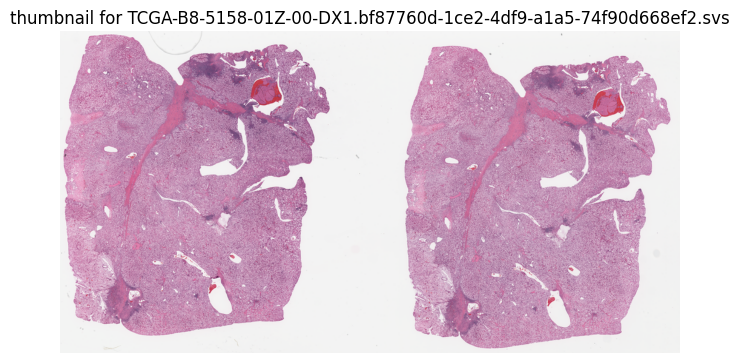

available levels and their dimensions: ((84000, 43527), (21000, 10881), (5250, 2720), (2625, 1360))
width and height at chosen level 2: 5250 2720


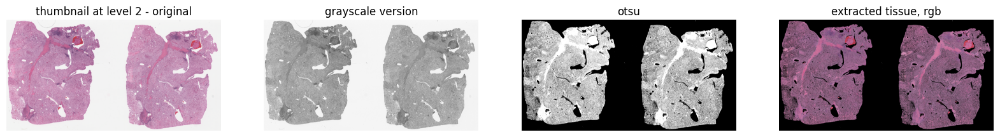

In [37]:
case_dir = config["wsi"]["wsi_slides"] + case_ids[0]
svs_paths = [f"{case_dir}/{svs_file}" for svs_file in os.listdir(case_dir) if svs_file.endswith('.svs')]
utils.display_wsi(svs_paths[2])
utils.display_tissue_extraction(svs_paths[2])

available levels and their dimensions: ((24001, 28637), (6000, 7159), (1500, 1789))
image dimensions at level 0: (24001, 28637)


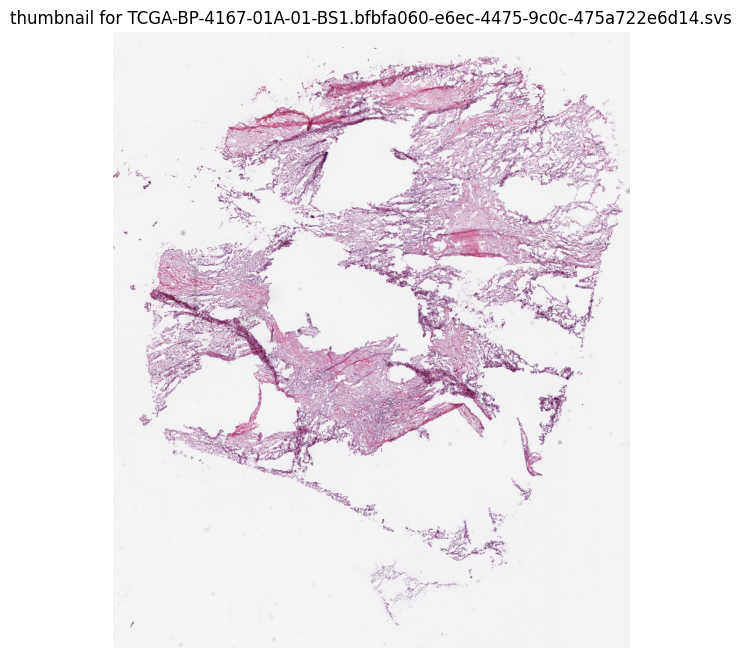

available levels and their dimensions: ((24001, 28637), (6000, 7159), (1500, 1789))
width and height at chosen level 2: 1500 1789


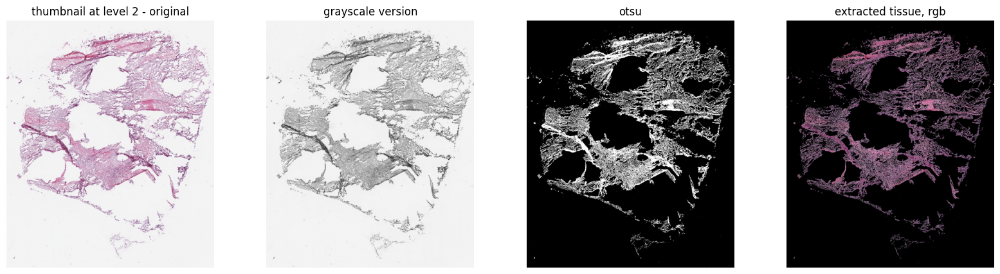

In [38]:
case_dir = config["wsi"]["wsi_slides"] + case_ids[1]
svs_paths = [f"{case_dir}/{svs_file}" for svs_file in os.listdir(case_dir) if svs_file.endswith('.svs')]

utils.display_wsi(svs_paths[0])
utils.display_tissue_extraction(svs_paths[0])

In [35]:
current = os.listdir(r"D:\data\wsi_slides")
len(set(full_case_ids) - set(current))

209

In [26]:
case_dir_1 = config["wsi"]["wsi_slides"] + case_ids[26]
print(case_dir_1)
case_dir_2 = config["wsi"]["wsi_slides"] + case_ids[30]
print(case_dir_2)

data1 = np.load(f"{case_dir_1}/patches_features.npy", allow_pickle=True).item() 

data2 = np.load(f"{case_dir_2}/patches_features.npy", allow_pickle=True).item() 


for value, _ in zip(data2.values(), range(5)):
    print(value.shape)

data1


D:/data/wsi_slides/TCGA-CJ-5686
D:/data/wsi_slides/TCGA-B0-5106
(512,)
(512,)
(512,)
(512,)
(512,)


{'TCGA-CJ-5686-01A-01-BS1.2d372d87-8d16-4cf1-bf49-c12fa57b71ad_10009_11985.png': array([4.09634471e-01, 9.65683758e-02, 2.57240087e-01, 2.12514257e+00,
        8.02557096e-02, 0.00000000e+00, 4.29546595e-01, 7.40670383e-01,
        2.70647931e+00, 5.32693155e-02, 7.99203000e-04, 3.86499584e-01,
        1.78120506e-03, 1.47178793e+00, 1.45270431e+00, 1.07071608e-01,
        1.85553938e-01, 0.00000000e+00, 1.84508085e+00, 5.97393572e-01,
        1.46201197e-02, 9.21994328e-01, 2.37330273e-02, 5.27242005e-01,
        1.07025862e+00, 2.68659204e-01, 5.46355963e-01, 2.34735131e+00,
        3.38310242e-01, 3.44068199e-01, 8.60376775e-01, 2.11515576e-01,
        7.80184925e-01, 9.23651531e-02, 1.59001529e-01, 2.76554793e-01,
        9.33467317e-03, 1.08698130e+00, 2.90318668e-01, 0.00000000e+00,
        5.23699820e-01, 6.59789860e-01, 1.10903752e+00, 2.10209560e+00,
        7.35682428e-01, 5.52889884e-01, 5.01758652e-03, 2.23447248e-01,
        6.61874771e-01, 1.86943784e-01, 3.60490143e-01, 

# Clustering

Embedding process:

- Each patient has no. clusters
- For each cluster, train a FCN to get the local rep for the patches of that cluster
- So then a patient has these local reps, use them to have attention and then final one-vector rep of a patient
- Final output
    - rows: patient/case ids
    - columns: final attention rep vectors

Use the above embedding to Cox directly

# Attention

file:///C:/Users/ASUS/Downloads/2009.11169v1.pdf

- Each patch has a cluster id === a cluster is consisted of a bunch patches/features_extracted (separate stage)
- A patient has clusters (fixed as inputs) and 1 cluster = 1 instance
- A patient: >>> extract features of the png patches for each instance/cluster
    - (1) put **png patches** of each instance (cluster of patches) through a model like MI-FCN (multiple instance fully CNN).
        - Quote: "We embed multiple sub-networks running inside our deep learning architecture with weights being shared among them as in the siamese architecture. Each sub-network is based on fully convolutional neural networks (FCN) that can learn informative representation for individual phenotype of the patient"
        - sub-networks use the same parameters (weights) (siamese) where two or more identical networks process different inputs. sharing weights helps each sub-network extract features in the same way and reduce the number of parameters
        - sub-networks are FULLY CONV network, meaning NO FULLY CONNECTED NETWORK for output like for classification/regression prediction; basically, stop at the feature extracted
        - Since the number of patches in each phenotype varies, the fully convolutional network is more flexible to handle this scenario.
        - trainable weights
        - output: each instance has a local rep 
        - 5 instances/clusters mean 5 vectors  $r_i$
    - (2) pool these local reps using attention model (with trainable weights to Cox loss) to condense these reps into one learned/best representation per patient ($\vec{z}$ with 64x1 dim)
- the trainable weights correspond to backprop on SGD towards Cox loss



The patient-level representation can be calculated as

$$
\mathbf{z} = \sum_{k=1}^{C} a_k \mathbf{r}_k,
$$

where

$$
a_k = \frac{\exp\{\mathbf{w}^\top \tanh(\mathbf{V} \mathbf{r}_k^\top)\}}{\sum_{j=1}^{C} \exp\{\mathbf{w}^\top \tanh(\mathbf{V} \mathbf{r}_j^\top)\}}.
$$

Quote: "In the weight $a_k$ calculation, $\mathbf{w} \in \mathbb{R}^{L \times 1}$ and $\mathbf{V} \in \mathbb{R}^{L \times M}$ are trainable parameters. Tangent $\tanh(.)$ element-wise non-linearity is introduced both negative and positive values for proper gradient flow. The attention-based MIL pooling allows to assign different weights to phenotype clusters within one patient and hence the final patient-level representation could be highly informative for survival prediction."


https://github.com/Novartis/torchsurv/blob/main/docs/notebooks/introduction.ipynb

Interpreting Cox partial log likelihood:

The loss penalizes the model when patients with earlier events (or higher risk) are not assigned higher risk scores. A lower loss suggests that the model’s ranking of patients (in terms of risk) is closer to the observed order of events. A decreasing Cox loss during training as an indication that the model is learning to rank patients more accurately with respect to their risk. However, the final evaluation should also consider additional metrics (like c-index)

In [7]:
class PatientWSIDataset(Dataset):
    """
    dataset for accessing a patient's list of patches features, each is of shape (1, n_patches, n_features)
    """
    def __init__(self, wsi_dir=config["wsi"]["wsi_slides"], labels_dir=config["labels"]["labels"]):
        self.wsi_dir = wsi_dir
        labels_df = pd.read_csv(labels_dir)
        self.case_ids = list(labels_df["submitter_id"].values)
        self.events = list(labels_df["event"].values)
        self.times = list(labels_df["time"].values)
        self.wsi_dirs = [os.path.join(self.wsi_dir, c) for c in self.case_ids]

    def __getitem__(self, idx):
        case_dir = self.wsi_dirs[idx]
        patches_features = np.load(case_dir + "/patches_features.npy", allow_pickle=True).item()
        cluster_ids = self.clustering(patches_features)

        features_list = list(patches_features.values())
        unique_clusters = np.unique(cluster_ids)
        n_clusters = len(unique_clusters)

        phenotype_tensors = [] # list of tensors, each tensor is a cluster's features of shape i.e. (1, 15 patches in this cluster, 512 as output of resnet18)

        for cluster in unique_clusters:
            cluster_features = [features for features, c in zip(features_list, cluster_ids) if c == cluster]
            tensor_cluster_features = torch.from_numpy(np.array(cluster_features)).float().unsqueeze(0) # (1, n_patches, n_features)

            phenotype_tensors.append(tensor_cluster_features.to(device))
            
        patient_time = torch.tensor(self.times[idx])
        patient_event = torch.tensor(self.events[idx])

        return phenotype_tensors, patient_time, patient_event

        # patches_features_cluster = {}
        # for (k, v), c in zip(patches_features.items(), cluster_ids):
        #     patches_features_cluster[k] = (v, c)
        # return patches_features_cluster

    def clustering(self, patches_features, n_clusters=5):
        feature_vectors = list(patches_features.values())
        kmeans = KMeans(n_clusters=n_clusters, random_state=0, n_init=50)
        cluster_ids = kmeans.fit_predict(feature_vectors)
        return cluster_ids

    def __len__(self):
        return len(self.case_ids)



def CoxLoss(hazard_pred, time, event, device, eps=1e-8):
    # flatten predictions
    hazard_pred = hazard_pred.view(-1)
    time = time.to(device, dtype=torch.float).view(-1)
    event = event.to(device, dtype=torch.float).view(-1)

    if event.sum() == 0:
        return torch.tensor(0.0, device=device)

    # compute risk set: R[i, j] = 1 if time[j] >= time[i]
    # TODO explain
    R_mat = torch.tensor(
        np.greater_equal.outer(
            time.cpu(), 
            time.cpu()).T.astype(np.float32),
        device=device
    )

    # standardize theta
    theta = (hazard_pred - hazard_pred.mean()) / (hazard_pred.std(unbiased=False) + eps)

    # compute the log risk set using the correct formula
    # NOTE: We use theta directly without an extra exp()
    # First, mask the non-risk set entries by multiplying exp(theta) with R_mat,
    # then take the log of the sum
    log_risk_set = torch.log(torch.sum(torch.exp(theta) * R_mat, dim=1) + eps)

    # negative partial likelihood only for events
    loss = -torch.mean((theta - log_risk_set) * event)

    return loss


class WSI_FCN(nn.Module):
    """
    https://arxiv.org/abs/2009.11169
    fully convolutional/connected network for WSI (2 experiments)
    takes 1 phenotype tensor/cluster of shape (1, n_patches, 512)
    outputs a local representation of that phenotype tensor of shape (1, 64)
    why FCN? on the numerical vectors? 
        - utilize the kernel, and especially kernel_size=1 because we can't have kernel_size>1 for randomly picked patches from the histopathology slides
        - so why not a simple fully connected network (MLP)? it's because it requires inputs with fixed dimension and we have varying number of patches for each cluster
    also, note that a patch -> FCN -> (1,64) shape. So if we have 300 patches or (300,64) shape, we would use avgpooling and get (1,64) as the final output for that cluster
    """
    def __init__(self, mode, in_features, out_features=64):
        super(WSI_FCN, self).__init__()

        self.mode = mode

        # Experiment 1: (closed March 4)
        self.conv = nn.Sequential(
            # conv1d because we only have a tensor of shape (N, C, L) = (1, 512, i.e. 272)
            nn.Conv1d(
                in_features, 
                out_features, 
                kernel_size=1 # kernel size = 1 is extremely important because we only want to the a single patch to be learned, 
                # doing i.e. 3x3 is no use because the patches are picked randomly, so can't use spatial relationship here
            ),
            nn.ReLU(),
            # adaptive avg pooling to get a local representation of the phenotype tensor
            # NOTE: adapative pooling from (64, 300 patches) to (64,1) as the final output of that cluster
            nn.AdaptiveAvgPool1d(1)
        )

        # Experiment 2: (start March 4)
        self.linear = nn.Sequential(
            # https://stackoverflow.com/a/58591606/19562762
            nn.Linear(in_features, 256),
            nn.ReLU(),
            nn.Dropout(0.3), # NOTE tuning
            nn.Linear(256, 128),
            nn.ReLU(),
            nn.Dropout(0.3), # NOTE tuning
            nn.Linear(128, out_features),
        )

    def forward(self, x):
        # input x: (1, n_patches, n_features)

        if self.mode == "conv":
            # permute to (1, n_features, n_patches) so that n_features become channels why? because tensor in pytorch reads () https://stackoverflow.com/questions/51541532/which-part-of-pytorch-tensor-represents-channels
            # n_patches is the length of the sequence. why?
            # FYI: for a conv2D, input should be in (N, C, H, W) format. N is the number of samples/batch_size. C is the channels. H and W are height and width resp: https://pytorch.org/docs/stable/generated/torch.nn.Conv2d.html#torch.nn.Conv2d 
            # but here we have conv1d: https://pytorch.org/docs/stable/generated/torch.nn.Conv1d.html#torch.nn.Conv1d
            x = x.permute(0, 2, 1) # (1, 512, 300 patches)
            # x = self.conv(x) # (1, 64, 300 patches)
            # x = self.relu(x) # (1, 64, 300 patches)
            # x = self.pool(x) # (1, 64, 1)
            x = self.conv(x)   # (1, 64, 1)
            x = x.view(x.size()[0], -1) # (1, 64)
            return x

        elif self.mode == "linear":
            x = self.linear(x) # (1, 64, 300 patches)
            x = torch.mean(x, dim=1) # (1,64) average
            return x # (1, 64)


class WSI_Attention(nn.Module):
    """
    pooling attention mechanism for WSI
    takes a local representation of the phenotype tensor of shape (5, 64) in which 5 is the number of clusters
    outputs a global representation of the phenotype tensors of shape (64-dim) which is a weighted sum across 5 clusters for 64 features
        each case has a global representation
    """
    def __init__(self, in_features, out_features=64):
        super(WSI_Attention, self).__init__()
        self.attention = nn.Sequential(
            nn.Linear(in_features, out_features),
            nn.Tanh(),  # tanh because we want to normalize the weights
            # why tanh() >> output values in range (-1,1), allowing both neg and pos values, often used in attention scores
            nn.Linear(out_features, 1),
        )

    def forward(self, x):
        # apply softmax because we have different number of clusters for each case
        # x: (5, 64) stack representation of 5 clusters/phenotypes
        scores = self.attention(x) # (5, 1)
        att_weights = torch.softmax(scores, dim=0).T # (1,5) which is probabilities
        # weighted sum across the 5 clusters:
        weights_applied = att_weights @ x  # (5, 64) = (1,5) @ (5,64)
        weighted_sum = torch.sum(weights_applied, dim=0) # (1, 64) or (64)
        return weighted_sum, att_weights


# for baseline --> when fused, use the main Fusion_MLP
class WSI_MLP_Cox(nn.Module):
    """
    takes a global representation of the phenotype tensor of shape (1, 64)
    outputs a risk score
    """
    def __init__(self, in_features):
        super(WSI_MLP_Cox, self).__init__()
        self.wsi_fcn = WSI_FCN("linear", in_features, out_features=64)
        self.attention = WSI_Attention(in_features=64, out_features=64)
        self.last_MLP = nn.Sequential(
            nn.Linear(in_features=64, out_features=32),
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(32,1)
        )

    def forward(self, list_phenotype_tensors):
        """
        each case has a list of 5 phenotype tensors
            each phenotype tensor is of shape (1, n_patches in the cluster, 512)
        returns a risk score
        """
        local_reps = [] # len=5

        # NOTE: IMPORTANT:
        # here since tensors have different no. images in each of them
        # we use the "flexiblity" of the FCN to output 1x64 for each cluster
        for tensor in list_phenotype_tensors:
            tensor = tensor.to(device)
            cluster_rep = self.wsi_fcn(tensor) # of shape (1, 64)
            local_reps.append(cluster_rep)
        
        # stack representation for each case into a tensor of shape (5, 64)
        tensor_local_reps = torch.cat(local_reps)

        # input it to the attention model
        agg_vector, att_weights = self.attention(tensor_local_reps) # agg is of shape (64-dim)

        # TODO: att_weights

        # final predict / a single number
        risk_score = self.last_MLP(agg_vector)
        return risk_score, att_weights


np.random.seed(0)
torch.manual_seed(0)
random.seed(0)
    
#######################
# prepare for training
#######################

def custom_collate(batch):
    """
    batch = [
        (list_of_phenotype_tensors, time1, event1),    => case 1
        (list_of_phenotype_tensors, time2, event2),    => case 2
        ...                                            => case 32
    ]
    """
    # each element in batch is a tuple: (list_of_phenotype_tensors, time, event)
    list_of_lists, times, events = zip(*batch)
    # list_of_lists is a tuple of length B (batch_size) where each element is a list of 5 tensors
    # i.e. [[t1,t2,t3,t4,t5],[t1,t2,t3,t4,t5],...,[t1,t2,t3,t4,t5]] = [32 lists]
    # leave them as is and let the model iterate over each sample
    return list(list_of_lists), torch.tensor(times), torch.tensor(events)

# config hyperparams
n_epochs = 5
lr = 0.001
batch_size = 32

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
wsi_data = PatientWSIDataset()
train_size, val_size = int(0.7 * len(wsi_data)), int(0.2 * len(wsi_data))
test_size = len(wsi_data) - train_size - val_size
train, val, test = random_split(wsi_data, [train_size, val_size, test_size])

train_loader = DataLoader(train, batch_size=batch_size, shuffle=True, collate_fn=custom_collate)
val_loader = DataLoader(val, batch_size=val_size, shuffle=False, collate_fn=custom_collate)
test_loader = DataLoader(test, batch_size=test_size, shuffle=False, collate_fn=custom_collate)

model = WSI_MLP_Cox(in_features=512) # rmb: 512 is the output dim from restnet18
model.to(device) 
optimizer = optim.Adam(model.parameters(), lr=lr)

In [ ]:
np.random.seed(0)
torch.manual_seed(0)
random.seed(0)

# train
for epoch in range(n_epochs):
    model.train()
    train_loss = 0.0

    for batch_lists_phenotype_clusters, batch_times, batch_events in tqdm(train_loader): # 32 cases in a batch
        risk_scores = [] # list of 32 risk scores for 32 cases
        # process each sample in the batch of 32
        for list_phenotype_tensors in batch_lists_phenotype_clusters: # 32 lists
            # list_phenotype_tensors = [t1,t2,t3,t4,t5]
            risk_score, _ = model(list_phenotype_tensors)
            risk_scores.append(risk_score) # append to risk scores that belong to 32 case ids in this batch

        # convert to tensor
        risk_scores = torch.stack(risk_scores)  # shape: (batch_size, 1) or (32,1) => each is a risk score for a case
        
        optimizer.zero_grad()
        # explain this coxloss - loss of 32 cases in the batch
        loss = CoxLoss(risk_scores, batch_times.to(device), batch_events.to(device), device)

        loss.backward()
        optimizer.step()

        train_loss += loss.item()

    print(f"epoch {epoch}, loss: {train_loss / len(train_loader)}")


100%|██████████| 12/12 [10:10<00:00, 50.85s/it]


epoch 0, loss: 0.9846155693133672


100%|██████████| 12/12 [10:11<00:00, 50.97s/it]


epoch 1, loss: 1.0461185028155644


100%|██████████| 12/12 [10:19<00:00, 51.61s/it]


epoch 2, loss: 1.1124784350395203


100%|██████████| 12/12 [10:39<00:00, 53.25s/it]


epoch 3, loss: 1.1351993680000305


100%|██████████| 12/12 [10:02<00:00, 50.20s/it]

epoch 4, loss: 1.0154778510332108


In [3]:
# validation

def concordance_index(hazards, times, events):
    """
    computes the c-index for survival prediction
    - hazards: predicted risk scores (higher means higher risk)
    - times: observed survival times
    - events: event indicators (1 if event occurred, 0 if censored)
    """
    n = len(times)
    concordant = 0.0
    permissible = 0.0
    for i in range(n):
        for j in range(n):
            # only compare if i had an event and its time is earlier than j
            if times[i] < times[j] and events[i] == 1:
                permissible += 1
                if hazards[i] > hazards[j]:
                    concordant += 1
                elif hazards[i] == hazards[j]:
                    concordant += 0.5
    return concordant / permissible if permissible > 0 else 0


model.eval()

val_hazards = []
val_times = []
val_events = []

with torch.no_grad():
    for batch in tqdm(val_loader):
        # unpack the batch
        list_of_phenotype_tensors_batch, times_tensor, events_tensor = batch
        
        # move times and events to the device
        times_tensor = times_tensor.to(device, dtype=torch.float)
        events_tensor = events_tensor.to(device, dtype=torch.float)
        
        # tterate over each sample in the batch
        for i, list_of_phenotype_tensors in enumerate(list_of_phenotype_tensors_batch):
            
            risk_score, _ = model(list_of_phenotype_tensors)
            
            val_hazards.append(risk_score.item())
            val_times.append(times_tensor[i].item())
            val_events.append(events_tensor[i].item())

100%|██████████| 1/1 [02:59<00:00, 179.89s/it]


validation c-index: 0.6872950819672131
log-rank p-value: 0.00032842865825160304


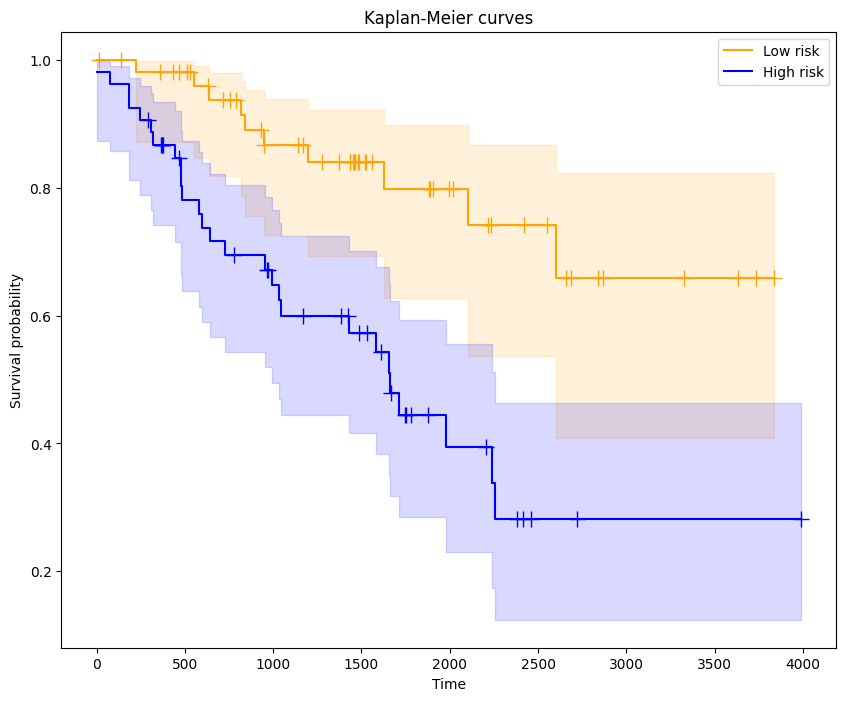

In [4]:
def log_rank(hazards, times, events):
    # to numpy arrays for easy indexing
    hazards = np.array(hazards)
    times = np.array(times)
    events = np.array(events)
    # masking low and high risk groupd based on median hazard
    high_risk_idx = hazards > np.median(hazards)
    low_risk_idx = hazards <= np.median(hazards)
    # log-rank test for p-value
    logrank = logrank_test(
        times[low_risk_idx],
        times[high_risk_idx],
        event_observed_A=events[low_risk_idx],
        event_observed_B=events[high_risk_idx]
    ) 
    return logrank.p_value


val_c_index = concordance_index(val_hazards, val_times, val_events)
print(f"validation c-index: {val_c_index}")

log_rank_pvalue = log_rank(val_hazards, val_times, val_events)
print(f"log-rank p-value: {log_rank_pvalue}")


val_hazards = np.array(val_hazards)
val_times = np.array(val_times)
val_events = np.array(val_events)
high_risk_idx = val_hazards > np.median(val_hazards)
low_risk_idx = val_hazards <= np.median(val_hazards)

kmf_high = KaplanMeierFitter()
kmf_low = KaplanMeierFitter()

fig, ax = plt.subplots(figsize=(10, 8))

# fit low risk
kmf_low.fit(val_times[low_risk_idx], event_observed=val_events[low_risk_idx], label='Low risk')
kmf_low.plot_survival_function(ax=ax, ci_show=True, ci_alpha=0.15, show_censors=True, color='orange')

# fit high risk
kmf_high.fit(val_times[high_risk_idx], event_observed=val_events[high_risk_idx], label='High risk')
kmf_high.plot_survival_function(ax=ax, ci_alpha=0.15, ci_show=True,show_censors=True, color='blue')

ax.set_title("Kaplan-Meier curves")
ax.set_xlabel("Time")
ax.set_ylabel("Survival probability")
plt.legend()
plt.show()

In [6]:
# save checkpoint 
from datetime import datetime, date

current_time = datetime.now().strftime("%H-%M-%S")
checkpoint_path = f"../checkpoints/model_wsi_{date.today()}_{val_c_index:4f}.pth"
torch.save({
    'model_state_dict': model.state_dict(), # all weights all models
    'optimizer_state_dict': optimizer.state_dict(),
    'loss': train_loss / len(train_loader),
    'batch_size': batch_size,
    'learning_rate': lr,
    'n_epochs': n_epochs,
    'random_seed': 0,
    'val_c_index': val_c_index,
    'log_rank_pvalue': log_rank_pvalue
}, checkpoint_path)

In [8]:
# re-use
np.random.seed(0)
torch.manual_seed(0)
random.seed(0)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_chkpt = WSI_MLP_Cox(in_features=512)
model_chkpt.to(device)
optimizer = optim.Adam(model_chkpt.parameters(), lr=1e-3)

checkpoint = torch.load(r"..\\checkpoints\model_wsi_2025-03-05_0.687295.pth", map_location=device)
model_chkpt.load_state_dict(checkpoint['model_state_dict'])
optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
start_epoch = checkpoint['n_epochs']
last_loss = checkpoint['loss']
val_c_index = checkpoint['val_c_index']
log_rank_pvalue = checkpoint['log_rank_pvalue']

model_chkpt.eval()

C:\Users\ASUS\AppData\Local\Temp\ipykernel_35072\2402425523.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(r"..\\checkpoints\model_wsi_2025-03-

WSI_MLP_Cox(
  (wsi_fcn): WSI_FCN(
    (conv): Sequential(
      (0): Conv1d(512, 64, kernel_size=(1,), stride=(1,))
      (1): ReLU()
      (2): AdaptiveAvgPool1d(output_size=1)
    )
    (linear): Sequential(
      (0): Linear(in_features=512, out_features=256, bias=True)
      (1): ReLU()
      (2): Dropout(p=0.3, inplace=False)
      (3): Linear(in_features=256, out_features=128, bias=True)
      (4): ReLU()
      (5): Dropout(p=0.3, inplace=False)
      (6): Linear(in_features=128, out_features=64, bias=True)
    )
  )
  (attention): WSI_Attention(
    (attention): Sequential(
      (0): Linear(in_features=64, out_features=64, bias=True)
      (1): Tanh()
      (2): Linear(in_features=64, out_features=1, bias=True)
    )
  )
  (last_MLP): Sequential(
    (0): Linear(in_features=64, out_features=32, bias=True)
    (1): ReLU()
    (2): Dropout(p=0.5, inplace=False)
    (3): Linear(in_features=32, out_features=1, bias=True)
  )
)

In [16]:
from lifelines.utils import concordance_index

# test final (NOTE ONCE!!!!!)

test_hazards = []
test_times = []
test_events = []

with torch.no_grad():
    for batch in tqdm(val_loader):
        list_of_phenotype_tensors_batch, times_tensor, events_tensor = batch

        times_tensor = times_tensor.to(device)
        events_tensor = events_tensor.to(device)
        
        for i, list_of_phenotype_tensors in enumerate(list_of_phenotype_tensors_batch):
            risk_score, _ = model_chkpt(list_of_phenotype_tensors)
            test_hazards.append(risk_score.item())
            test_times.append(times_tensor[i].item())
            test_events.append(events_tensor[i].item())

100%|██████████| 1/1 [03:28<00:00, 208.91s/it]


test_c_index: 0.6872950819672131
log-rank test p-value: 0.00032842865825160304


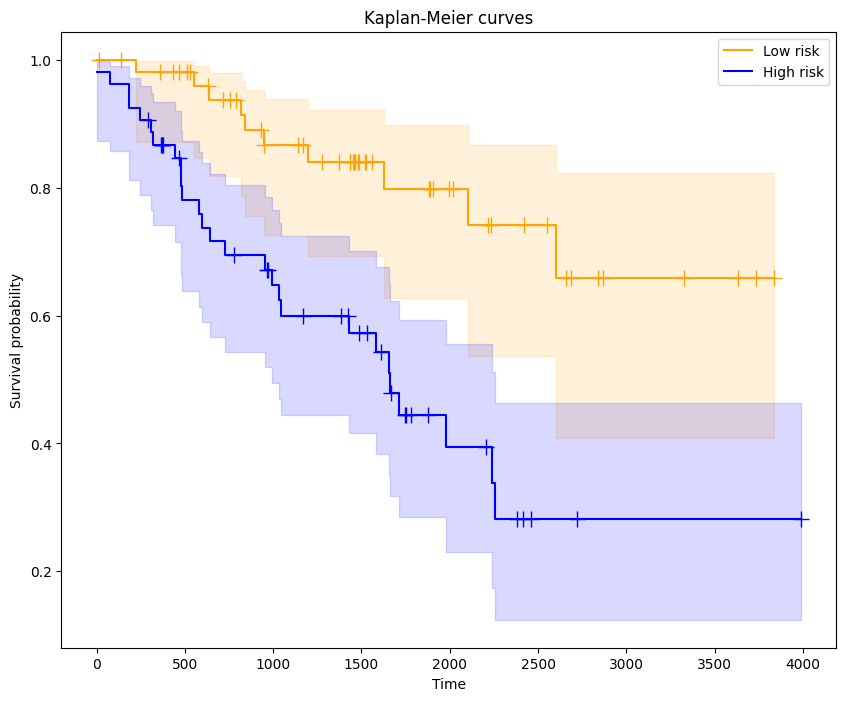

In [18]:
test_c_index = concordance_index(test_times, -np.array(test_hazards), test_events)
print(f"test_c_index: {test_c_index}")

# to numpy arrays for easy indexing
test_hazards = np.array(test_hazards)
test_times = np.array(test_times)
test_events = np.array(test_events)

# masking low and high risk groupd based on median hazard
high_risk_idx = test_hazards > np.median(test_hazards)
low_risk_idx = test_hazards <= np.median(test_hazards)

# log-rank test for p-value
logrank = logrank_test(
    test_times[low_risk_idx],
    test_times[high_risk_idx],
    event_observed_A=test_events[low_risk_idx],
    event_observed_B=test_events[high_risk_idx]
) 
print("log-rank test p-value:", logrank.p_value)

kmf_high = KaplanMeierFitter()
kmf_low = KaplanMeierFitter()

fig, ax = plt.subplots(figsize=(10, 8))

# fit low risk
kmf_low.fit(test_times[low_risk_idx], event_observed=test_events[low_risk_idx], label='Low risk')
kmf_low.plot_survival_function(ax=ax, ci_show=True, ci_alpha=0.15, show_censors=True, color='orange')

# fit high risk
kmf_high.fit(test_times[high_risk_idx], event_observed=test_events[high_risk_idx], label='High risk')
kmf_high.plot_survival_function(ax=ax, ci_show=True, ci_alpha=0.15, show_censors=True, color='blue')

ax.set_title("Kaplan-Meier curves")
ax.set_xlabel("Time")
ax.set_ylabel("Survival probability")
plt.legend()
plt.show()

In [19]:

def bootstrap_c_index(times, risks, events, n_bootstrap=300): # TODO: to choose
    random.seed(0)
    np.random.seed(0)

    indices = np.arange(len(times))
    bootstrap_scores = []

    for _ in range(n_bootstrap):
        # sample with replacement
        sample_indices = np.random.choice(indices, size=len(indices), replace=True)
        boot_times = np.array(times)[sample_indices]
        boot_risks = np.array(risks)[sample_indices]
        boot_events = np.array(events)[sample_indices]
        score = concordance_index(boot_times, -boot_risks, boot_events)
        bootstrap_scores.append(score)
        
    return np.mean(bootstrap_scores), np.std(bootstrap_scores)

mean_c_index, std_c_index = bootstrap_c_index(test_times, test_hazards, test_events)
print(f"bootstrap mean c-index: {mean_c_index}, standard deviation: {std_c_index}")

bootstrap mean c-index: 0.6868259133198008, standard deviation: 0.055994811236889236


In [79]:
# sanity check

In [13]:
np.random.seed(0)

k_clusters = 5
one_patient_list_phenotype_clusters = []

for _ in range(k_clusters):
    tensor = torch.randn(1, np.random.randint(100, 500), 512)  # each is of shape (1, i.e. 272, 512)
    one_patient_list_phenotype_clusters.append(tensor)

one_patient_list_phenotype_clusters

[tensor([[[-1.6462,  0.8581,  0.9722,  ..., -0.5181, -1.0092, -0.0085],
          [ 1.0575,  0.2642, -0.7941,  ..., -0.3370, -0.9174,  1.0036],
          [ 0.3226, -0.8393,  1.7651,  ..., -0.0370, -0.3159,  0.8465],
          ...,
          [ 1.1029, -1.0553, -0.9148,  ..., -1.6374,  0.5308, -1.0573],
          [ 0.6565, -0.0168, -0.4314,  ...,  0.8078,  1.0095,  0.8405],
          [ 0.2401, -0.3199, -1.2036,  ..., -0.4719,  0.5938,  0.1592]]]),
 tensor([[[ 2.2584,  0.2875,  0.3597,  ..., -0.0641, -1.4974,  0.5540],
          [-0.9622,  0.5266, -0.6849,  ..., -1.0825,  0.1129, -1.1677],
          [-0.9630, -1.3964, -0.0842,  ..., -0.6465,  0.7569, -0.3464],
          ...,
          [ 0.0174,  1.0938,  1.2267,  ...,  0.7879, -0.3821, -0.0199],
          [ 0.1776, -1.1898, -1.1019,  ...,  0.2538, -1.2333, -0.1013],
          [ 1.3612, -1.1788, -0.0418,  ...,  1.3220, -1.1230, -0.5190]]]),
 tensor([[[-2.8663, -0.9477, -1.0899,  ..., -1.3462, -1.4021, -2.9401],
          [ 0.2487,  1.4139,

In [16]:
class WSI_FCN(nn.Module):
    """
    fully connected network for WSI
    takes 1 phenotype tensor/cluster of shape (1, n_patches, 512)
    outputs a local representation of that phenotype tensor of shape (1, 64)
    why FCN on the numerical vectors?

    """
    def __init__(self, in_features, out_features=64):
        super(WSI_FCN, self).__init__()
        # conv1d because we only have a tensor of shape (N, C, L) = (1, 512, i.e. 272)
        self.conv = nn.Conv1d(
            in_features, 
            out_features, 
            kernel_size=1 # kernel size = 1 is extremely important because we only want to the a single patch to be learned, 
            # doing i.e. 3x3 is no use because the patches are picked randomly, so can't use spatial relationship here
        )
        self.relu = nn.ReLU()

        # adaptive avg pooling to get a local representation of the phenotype tensor
        # NOTE: adapative pooling because ?????
        self.pool = nn.AdaptiveAvgPool1d(1)

    def forward(self, x):
        # x: (1, n_patches, n_features)
        # permute to (1, n_features, n_patches) so that n_features become channels why? because tensor in pytorch reads ()
        # n_patches is the length of the sequence. why?
        # FYI: for a conv2D, input should be in (N, C, H, W) format. N is the number of samples/batch_size. C is the channels. H and W are height and width resp: https://pytorch.org/docs/stable/generated/torch.nn.Conv2d.html#torch.nn.Conv2d 
        # but here we have conv1d: https://pytorch.org/docs/stable/generated/torch.nn.Conv1d.html#torch.nn.Conv1d

        print("original input x:", x.shape) # (1, 300, 512)
        print(f"next, permutate so that {x.shape} >> becomes {x.permute(0, 2, 1).shape}")
        x = x.permute(0, 2, 1)  # (1, 512, 300)

        print("THIS IS IMPORTANT:")
        x = self.conv(x) # (1, 64, 300 patches)
        print("conv:", x.shape)
        x = self.relu(x) # (1, 64, 300 patches)
        print("relu:", x.shape)
        
        x = self.pool(x) # (1, 64, 1)
        print("pool at the end from 272 patches to 1 single vector:", x.shape)
        x = x.view(x.size()[0], -1) # (1, 64)
        return x # (1, 64)

for cluster_tensor in one_patient_list_phenotype_clusters:
    model_fcn_check = WSI_FCN(in_features=512, out_features=64)
    out = model_fcn_check(cluster_tensor)
    print(out.shape)
    break

original input x: torch.Size([1, 272, 512])
next, permutate so that torch.Size([1, 272, 512]) >> becomes torch.Size([1, 512, 272])
THIS IS IMPORTANT:
conv: torch.Size([1, 64, 272])
relu: torch.Size([1, 64, 272])
pool at the end from 272 patches to 1 single vector: torch.Size([1, 64, 1])
torch.Size([1, 64])


In [20]:
t = r"D:\data\wsi_slides\TCGA-B0-5402\patches_features.npy"

a = np.load(t, allow_pickle=True).item()

In [25]:
one_tile = a["TCGA-B0-5402-01Z-00-DX1.dc8a5519-2b6f-473e-9420-b26e59f7c4c9_10000_63492.png"]
one_tile

array([4.30715895e+00, 2.05736637e-01, 3.18930417e-01, 6.72997415e-01,
       4.87155328e-03, 1.19838965e+00, 1.33056819e-01, 5.12134790e-01,
       3.92583871e+00, 5.19544423e-01, 1.91680148e-01, 3.39700675e+00,
       4.41367179e-02, 3.58824342e-01, 5.38965464e-01, 5.54788291e-01,
       6.72781944e-01, 4.11677313e+00, 3.97319868e-02, 3.68088335e-01,
       1.10851860e+00, 5.53445041e-01, 4.32879142e-02, 0.00000000e+00,
       1.20882356e+00, 1.24545150e-01, 1.78530052e-01, 2.28089023e+00,
       2.54095718e-02, 3.23800594e-01, 1.49119690e-01, 0.00000000e+00,
       1.83104002e+00, 6.05608290e-03, 1.10858250e-02, 2.39376760e+00,
       0.00000000e+00, 2.21307659e+00, 4.99779396e-02, 2.23797739e-01,
       6.82434380e-01, 1.10462236e+00, 7.83894897e-01, 9.88965392e-01,
       3.49574447e-01, 1.88755959e-01, 2.71320522e-01, 1.18381512e+00,
       2.97787786e+00, 2.52363658e+00, 1.88085806e+00, 2.52356863e+00,
       8.06120396e-01, 1.83612049e-01, 9.69517753e-02, 0.00000000e+00,
      